In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

data = pd.read_csv('../DataOut/bus_trip_all_points.csv')

In [2]:
# import bus trips
bus_trips = pd.read_csv("../DataOut/bus_trips.csv")

In [3]:
data

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction
0,574733098,116,2021-10-16 08:03:04,7.293092,80.635573,9.17927,2021-10-16,08:03:04,POINT (184746.41595346577 232322.75960448402),BT01,2.0,1
1,574733099,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,POINT (184841.00784031872 232320.15459256113),NaN,2.0,1
2,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1
3,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1
4,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1299052,897183269,1719,2022-02-25 09:20:30,7.291665,80.635343,6.47948,2022-02-25,09:20:30,POINT (184720.9728106963 232165.01034694258),BT01,15890.0,2
1299053,897881718,1719,2022-02-25 12:20:33,7.298970,80.733818,13.49890,2022-02-25,12:20:33,POINT (195594.19080339494 232970.71466525554),BT02,15892.0,2
1299054,898099616,1719,2022-02-25 13:15:43,7.291682,80.635215,8.09935,2022-02-25,13:15:43,POINT (184706.8070567022 232166.85029675177),BT01,15892.0,2
1299055,898722926,1719,2022-02-25 16:00:04,7.298873,80.733850,14.57880,2022-02-25,16:00:04,POINT (195597.678970129 232960.0210734187),BT02,15894.0,2


In [4]:
# get the number of unique deviceid
deviceid = data['deviceid'].unique()
deviceid

array([ 116,  117,  121,  123,  128,  209,  250,  262,  264,  274,  275,
        279,  284,  294,  505,  513,  550, 1143, 1166, 1358, 1377, 1408,
       1409, 1410, 1718, 1719], dtype=int64)

## Detect and remove Anomaly Trips

In [5]:

# from sklearn.metrics.pairwise import haversine_distances
# from math import radians

# # Define a function to calculate Haversine distance between two points
# def haversine_distance(coord1, coord2):
#     coord1 = [radians(x) for x in coord1]
#     coord2 = [radians(x) for x in coord2]
#     dist = haversine_distances([coord1, coord2])
#     return dist[0][1] * 6371000.0  # Multiply by Earth radius to get distance in meters

# # Define the anomaly detection function
# def detect_anomalies(data, trip_id_column, longitude_column, latitude_column, reference_data, reference_trip_id, threshold_distance_meters=200):
#     reference_locations = reference_data[reference_data[trip_id_column] == reference_trip_id]
#     reference_locations = reference_locations[[latitude_column, longitude_column]].values
    
#     anomalies = []
#     for trip_id in data[trip_id_column].unique():
#         trip_data = data[data[trip_id_column] == trip_id]
#         gps_locations = trip_data[[latitude_column, longitude_column]].values
        
#         anomaly_count = 0
#         for location in gps_locations:
#             min_distance = min([haversine_distance(location, ref_loc) for ref_loc in reference_locations])
#             if min_distance > threshold_distance_meters:
#                 anomaly_count += 1
#         print(f"anomaly count : {anomaly_count}")
#         if anomaly_count / len(gps_locations) >= 0.1:
#             anomalies.append(trip_id)
#             print(f"anomaly trip id : {trip_id}")
    
#     return anomalies

# # Columns for trip ID, longitude, and latitude in your DataFrame
# trip_id_column = 'trip_id'
# longitude_column = 'longitude'
# latitude_column = 'latitude'

# # Reference data for correct GPS locations (longitude and latitude values)
# reference_trip_id = 4  # Specify the trip ID for which to get the reference data
# reference_data = data[data[trip_id_column] == reference_trip_id]  # Filter reference data

# # Detect and remove anomaly trips
# anomaly_trip_ids = detect_anomalies(data, trip_id_column, longitude_column, latitude_column, reference_data, reference_trip_id)
# cleaned_data = data[~data[trip_id_column].isin(anomaly_trip_ids)]

# print(f"Anomaly trips detected and removed: {anomaly_trip_ids}")

# # save anomally trip id list in to csv file
# anomaly_trip_ids_df = pd.DataFrame(anomaly_trip_ids)
# anomaly_trip_ids_df.to_csv('../DataOut/anomaly_trip_ids.csv', index=False)



In [6]:
# import pandas as pd
# from sklearn.metrics.pairwise import haversine_distances
# from math import radians
# from concurrent.futures import ThreadPoolExecutor

# # Define a function to calculate Haversine distance between two points
# def haversine_distance(coord1, coord2):
#     coord1 = [radians(x) for x in coord1]
#     coord2 = [radians(x) for x in coord2]
#     dist = haversine_distances([coord1, coord2])
#     return dist[0][1] * 6371000.0  # Multiply by Earth radius to get distance in meters


# # Define a function to process each trip ID for anomaly detection
# def process_trip(trip_data, reference_data, threshold_distance_meters):
#     reference_locations = reference_data[[latitude_column, longitude_column]].values
#     gps_locations = trip_data[[latitude_column, longitude_column]].values
    
#     anomaly_count = 0
#     for location in gps_locations:
#         min_distance = min([haversine_distance(location, ref_loc) for ref_loc in reference_locations])
#         if min_distance > threshold_distance_meters:
#             anomaly_count += 1
#     print(f"anomaly count : {anomaly_count}")
#     if anomaly_count / len(gps_locations) >= 0.1:
#         return trip_data['trip_id'].values[0]
#         print(f"anomaly trip id : {trip_id}")
#     return None

# # Columns for trip ID, longitude, and latitude in your DataFrame
# trip_id_column = 'trip_id'
# longitude_column = 'longitude'
# latitude_column = 'latitude'


# # Split data into chunks for parallel processing
# chunk_size = 10  # Number of trip IDs in each chunk
# trip_ids = data[trip_id_column].unique()
# chunks = [trip_ids[i:i + chunk_size] for i in range(0, len(trip_ids), chunk_size)]

# # Reference data for correct GPS locations (longitude and latitude values)
# reference_trip_id = 4  # Specify the trip ID for which to get the reference data
# reference_data = data[data[trip_id_column] == reference_trip_id]  # Filter reference data


# threshold_distance_meters=200

# # Create a ThreadPoolExecutor for parallel processing
# with ThreadPoolExecutor(max_workers=16) as executor:
#     futures = []
#     for chunk_trip_ids in chunks:
#         chunk_data = data[data[trip_id_column].isin(chunk_trip_ids)]
#         for trip_id in chunk_trip_ids:
#             chunk_trip_data = chunk_data[chunk_data[trip_id_column] == trip_id]
#             future = executor.submit(process_trip, chunk_trip_data, reference_data, threshold_distance_meters)
#             futures.append(future)

#     anomaly_trip_ids = []
#     for future in futures:
#         result = future.result()
#         if result:
#             anomaly_trip_ids.append(result)

# # Filter anomaly trips and save to CSV
# cleaned_data = data[~data[trip_id_column].isin(anomaly_trip_ids)]

# print(f"Anomaly trips detected and removed: {anomaly_trip_ids}")

# # Save anomaly trip IDs to CSV file
# anomaly_trip_ids_df = pd.DataFrame(anomaly_trip_ids, columns=[trip_id_column])
# anomaly_trip_ids_df.to_csv('../DataOut/anomaly_trip_ids.csv', index=False)


In [7]:
# # Anomaly trips detected and removed: [166.0, 193.0, 195.0, 207.0, 235.0, 1081.0, 1105.0, 141.0, 147.0, 153.0, 155.0, 157.0, 160.0, 171.0, 177.0, 190.0, 194.0, 206.0, 210.0, 226.0, 879.0]
# # Anomaly trips detected and removed: [524.0, 851.0, 895.0, 1201.0, 1219.0, 1291.0, 1341.0, 1612.0, 1705.0, 1853.0, 1871.0, 1887.0, 1890.0, 1957.0, 1983.0, 1990.0, 1995.0, 1998.0, 2014.0, 2023.0, 2028.0, 2029.0, 2034.0, 2035.0, 2055.0, 2062.0, 2101.0, 2108.0, 2115.0, 2122.0, 2149.0, 2150.0, 2157.0, 2162.0, 2165.0, 2171.0, 2214.0, 2237.0, 2244.0, 2263.0, 2270.0, 2277.0, 2306.0, 2313.0, 2320.0, 2327.0, 2362.0, 2440.0, 2467.0, 2469.0, 2481.0, 2511.0, 2517.0, 2525.0, 2531.0, 2535.0, 2559.0, 2597.0, 2625.0, 2659.0, 2685.0, 2760.0, 2800.0, 2870.0, 2920.0, 3059.0, 3094.0, 3122.0, 3136.0, 3206.0, 3246.0, 3311.0, 3339.0, 3357.0, 3463.0, 3682.0, 4189.0, 4457.0, 4562.0, 4564.0, 4618.0, 4866.0, 5324.0, 5368.0, 5561.0, 5583.0, 120.0, 1778.0, 1982.0, 2019.0, 2036.0, 2052.0, 2415.0, 2421.0, 2427.0, 2429.0, 2431.0, 2434.0, 2445.0, 2451.0, 2464.0, 2468.0, 2480.0, 2484.0, 2500.0, 2514.0, 2524.0, 2528.0, 2532.0, 2536.0, 2550.0, 2558.0, 2566.0, 2568.0, 2574.0, 2576.0, 2588.0, 2594.0, 2598.0, 2600.0, 2610.0, 2616.0, 2624.0, 2640.0, 2648.0, 2676.0, 2684.0, 2692.0, 2702.0, 2710.0, 2718.0, 2720.0, 2732.0, 2733.0, 2747.0, 2755.0, 2763.0, 2765.0, 2767.0, 2781.0, 2795.0, 2803.0, 2851.0, 2867.0, 2921.0, 2935.0, 2943.0, 2977.0, 3245.0, 3310.0, 3338.0, 3356.0, 3456.0, 3669.0, 3787.0, 3970.0, 4188.0, 4304.0, 4561.0, 4663.0, 4763.0, 5043.0, 5185.0, 5519.0, 5560.0, 5573.0]
# anomaly_trip_ids=[166.0, 193.0, 195.0, 207.0, 235.0, 1081.0, 1105.0, 141.0, 147.0, 153.0, 155.0, 157.0, 160.0, 171.0, 177.0, 190.0, 194.0, 206.0, 210.0, 226.0, 879.0]
# anomaly_trip_ids=[524.0, 851.0, 895.0, 1201.0, 1219.0, 1291.0, 1341.0, 1612.0, 1705.0, 1853.0, 1871.0, 1887.0, 1890.0, 1957.0, 1983.0, 1990.0, 1995.0, 1998.0, 2014.0, 2023.0, 2028.0, 2029.0, 2034.0, 2035.0, 2055.0, 2062.0, 2101.0, 2108.0, 2115.0, 2122.0, 2149.0, 2150.0, 2157.0, 2162.0, 2165.0, 2171.0, 2214.0, 2237.0, 2244.0, 2263.0, 2270.0, 2277.0, 2306.0, 2313.0, 2320.0, 2327.0, 2362.0, 2440.0, 2467.0, 2469.0, 2481.0, 2511.0, 2517.0, 2525.0, 2531.0, 2535.0, 2559.0, 2597.0, 2625.0, 2659.0, 2685.0, 2760.0, 2800.0, 2870.0, 2920.0, 3059.0, 3094.0, 3122.0, 3136.0, 3206.0, 3246.0, 3311.0, 3339.0, 3357.0, 3463.0, 3682.0, 4189.0, 4457.0, 4562.0, 4564.0, 4618.0, 4866.0, 5324.0, 5368.0, 5561.0, 5583.0, 120.0, 1778.0, 1982.0, 2019.0, 2036.0, 2052.0, 2415.0, 2421.0, 2427.0, 2429.0, 2431.0, 2434.0, 2445.0, 2451.0, 2464.0, 2468.0, 2480.0, 2484.0, 2500.0, 2514.0, 2524.0, 2528.0, 2532.0, 2536.0, 2550.0, 2558.0, 2566.0, 2568.0, 2574.0, 2576.0, 2588.0, 2594.0, 2598.0, 2600.0, 2610.0, 2616.0, 2624.0, 2640.0, 2648.0, 2676.0, 2684.0, 2692.0, 2702.0, 2710.0, 2718.0, 2720.0, 2732.0, 2733.0, 2747.0, 2755.0, 2763.0, 2765.0, 2767.0, 2781.0, 2795.0, 2803.0, 2851.0, 2867.0, 2921.0, 2935.0, 2943.0, 2977.0, 3245.0, 3310.0, 3338.0, 3356.0, 3456.0, 3669.0, 3787.0, 3970.0, 4188.0, 4304.0, 4561.0, 4663.0, 4763.0, 5043.0, 5185.0, 5519.0, 5560.0, 5573.0]

anom=pd.read_csv('../DataOut/anomaly_trip_ids.csv')
anomaly_trip_ids = anom['0'].tolist()

cleaned_data = data[~data['trip_id'].isin(anomaly_trip_ids)]

data= cleaned_data

print(f"Anomaly trips detected and removed: {anomaly_trip_ids}")

Anomaly trips detected and removed: [524.0, 851.0, 895.0, 1201.0, 1219.0, 1291.0, 1341.0, 1612.0, 1705.0, 1853.0, 1871.0, 1887.0, 1890.0, 1957.0, 1983.0, 1990.0, 1995.0, 1998.0, 2014.0, 2023.0, 2028.0, 2029.0, 2034.0, 2035.0, 2055.0, 2062.0, 2101.0, 2108.0, 2115.0, 2122.0, 2149.0, 2150.0, 2157.0, 2162.0, 2165.0, 2171.0, 2214.0, 2237.0, 2244.0, 2263.0, 2270.0, 2277.0, 2306.0, 2313.0, 2320.0, 2327.0, 2362.0, 2440.0, 2467.0, 2469.0, 2481.0, 2511.0, 2517.0, 2525.0, 2531.0, 2535.0, 2559.0, 2597.0, 2625.0, 2659.0, 2685.0, 2760.0, 2800.0, 2870.0, 2920.0, 3059.0, 3094.0, 3122.0, 3136.0, 3206.0, 3246.0, 3311.0, 3339.0, 3357.0, 3463.0, 3682.0, 4189.0, 4457.0, 4562.0, 4564.0, 4618.0, 4866.0, 5324.0, 5368.0, 5561.0, 5583.0, 120.0, 1778.0, 1982.0, 2019.0, 2036.0, 2052.0, 2415.0, 2421.0, 2427.0, 2429.0, 2431.0, 2434.0, 2445.0, 2451.0, 2464.0, 2468.0, 2480.0, 2484.0, 2500.0, 2514.0, 2524.0, 2528.0, 2532.0, 2536.0, 2550.0, 2558.0, 2566.0, 2568.0, 2574.0, 2576.0, 2588.0, 2594.0, 2598.0, 2600.0, 2610.0,

In [8]:
# len(anomaly_trip_ids)

## feature Eng

### Add Acceleration

In [9]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame named 'data' with columns: 'speed', 'devicetime', and 'trip_id'
# Convert the 'devicetime' column to pandas Timestamp if it's not already
data['devicetime'] = pd.to_datetime(data['devicetime'])

# Calculate time difference between consecutive rows within the same trip
data['time_diff'] = data.groupby('trip_id')['devicetime'].diff()

# Calculate change in speed between consecutive rows within the same trip
data['speed_diff'] = data.groupby('trip_id')['speed'].diff()

# Filter out rows with time differences close to zero
data = data[data['time_diff'].dt.total_seconds() > 0.001]  # Adjust the threshold as needed

# Calculate acceleration by dividing speed difference by time difference (avoiding division by zero)
data['acceleration'] = data['speed_diff'] / data['time_diff'].dt.total_seconds()

# Handle the case where time difference is zero or very close to zero, set acceleration to 0
data['acceleration'].replace([np.inf, -np.inf], np.nan, inplace=True)
data['acceleration'].fillna(0, inplace=True)

print(data)


C:\Users\gw\AppData\Local\Temp\ipykernel_53760\493667457.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['devicetime'] = pd.to_datetime(data['devicetime'])
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\493667457.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['time_diff'] = data.groupby('trip_id')['devicetime'].diff()
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\493667457.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

                id  deviceid          devicetime  latitude  longitude  \
1        574733099       116 2021-10-16 08:03:19  7.293068  80.636430   
2        574733100       116 2021-10-16 08:03:34  7.293043  80.637552   
3        574733101       116 2021-10-16 08:03:49  7.292725  80.637707   
4        574733102       116 2021-10-16 08:04:04  7.292292  80.637663   
5        574736662       116 2021-10-16 08:04:19  7.291640  80.637455   
...            ...       ...                 ...       ...        ...   
1299048  894788822      1719 2022-02-24 14:00:04  7.291628  80.635280   
1299050  895724319      1719 2022-02-24 18:03:00  7.291675  80.635278   
1299052  897183269      1719 2022-02-25 09:20:30  7.291665  80.635343   
1299054  898099616      1719 2022-02-25 13:15:43  7.291682  80.635215   
1299056  898917340      1719 2022-02-25 16:48:05  7.291622  80.635255   

            speed        date      time  \
1        14.03890  2021-10-16  08:03:19   
2        10.25920  2021-10-16  08:03:

In [10]:
import pandas as pd

# Count Infinity values in each column
infinity_count = data.isin([np.inf, -np.inf]).sum()

print("Number of Infinity values in each column:")
print(infinity_count)


Number of Infinity values in each column:
id              0
deviceid        0
devicetime      0
latitude        0
longitude       0
speed           0
date            0
time            0
geometry        0
bus_stop        0
trip_id         0
direction       0
time_diff       0
speed_diff      0
acceleration    0
dtype: int64


In [11]:
# fill Nan values with 0
data['acceleration'].fillna(0, inplace=True)
# drop time_diff and speed_diff columns
data.drop(['time_diff', 'speed_diff'], axis=1, inplace=True)

C:\Users\gw\AppData\Local\Temp\ipykernel_53760\1802797475.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['acceleration'].fillna(0, inplace=True)
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\1802797475.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop(['time_diff', 'speed_diff'], axis=1, inplace=True)


In [12]:
# save to csv
data.to_csv('../DataOut/bus_trip_all_points_with_acceleration.csv', index=False)

In [13]:
data

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration
1,574733099,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,POINT (184841.00784031872 232320.15459256113),NaN,2.0,1,0.323975
2,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1,-0.251980
3,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1,-0.179987
4,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1,-0.251980
5,574736662,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,POINT (184954.1363920236 232162.16484193364),101,2.0,1,0.359971
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1299048,894788822,1719,2022-02-24 14:00:04,7.291628,80.635280,9.71923,2022-02-24,14:00:04,POINT (184713.98228291195 232160.95408285945),BT01,15887.0,2,-0.001092
1299050,895724319,1719,2022-02-24 18:03:00,7.291675,80.635278,7.55940,2022-02-24,18:03:00,POINT (184713.79613721426 232166.11833986486),BT01,15889.0,2,0.000869
1299052,897183269,1719,2022-02-25 09:20:30,7.291665,80.635343,6.47948,2022-02-25,09:20:30,POINT (184720.9728106963 232165.01034694258),BT01,15890.0,2,-0.002883
1299054,898099616,1719,2022-02-25 13:15:43,7.291682,80.635215,8.09935,2022-02-25,13:15:43,POINT (184706.8070567022 232166.85029675177),BT01,15892.0,2,-0.001631


### Radial Acc

In [14]:
# from math import cos, radians, sqrt
# from pyproj import Proj, Transformer

# def lat_lon_to_utm(lat, lon):
#     # Create a UTM projection for the appropriate UTM zone (Zone 44N for Sri Lanka)
#     utm_zone = 44
#     utm_proj = Proj(proj='utm', zone=utm_zone, ellps='WGS84')

#     # Convert latitude and longitude to UTM coordinates
#     utm_easting, utm_northing = utm_proj(lon, lat)
#     return utm_easting, utm_northing
# # Calculate radius of curvature using OpenStreetMap API

# def calculate_radius_of_curvature(x1, y1, x2, y2, x3,y3):
#     x12 = x1 - x2;
#     x13 = x1 - x3;
 
#     y12 = y1 - y2;
#     y13 = y1 - y3;
 
#     y31 = y3 - y1;
#     y21 = y2 - y1;
 
#     x31 = x3 - x1;
#     x21 = x2 - x1;
 
#     # x1^2 - x3^2
#     sx13 = pow(x1, 2) - pow(x3, 2);
 
#     # y1^2 - y3^2
#     sy13 = pow(y1, 2) - pow(y3, 2);
 
#     sx21 = pow(x2, 2) - pow(x1, 2);
#     sy21 = pow(y2, 2) - pow(y1, 2);
    
#     denominator = 2 * ((y31) * (x12) - (y21) * (x13))
    
#     # Avoid division by zero
#     if denominator == 0:
#         return 0  # Or some other value you want to use
        
#     f = (((sx13) * (x12) + (sy13) *
#           (x12) + (sx21) * (x13) +
#           (sy21) * (x13)) // denominator)
             
#     g = (((sx13) * (y12) + (sy13) * (y12) +
#           (sx21) * (y13) + (sy21) * (y13)) //
#           (2 * ((x31) * (y12) - (x21) * (y13))));
 
#     c = (-pow(x1, 2) - pow(y1, 2) -
#          2 * g * x1 - 2 * f * y1);
 
#     # eqn of circle be x^2 + y^2 + 2*g*x + 2*f*y + c = 0
#     # where centre is (h = -g, k = -f) and
#     # radius r as r^2 = h^2 + k^2 - c
#     h = -g;
#     k = -f;
#     sqr_of_r = h * h + k * k - c;
 
#     # r is the radius
#     r = round(sqrt(sqr_of_r), 5);
#     return r
    

# # Calculate radial acceleration based on speed and radius of curvature
# def calculate_radial_acceleration(speed, radius_of_curvature):
#     if radius_of_curvature != 0:
#         radial_acceleration = speed**2 / radius_of_curvature
#     else:
#         radial_acceleration = 0
#     return radial_acceleration

# # Create a dictionary to store DataFrames for each trip ID
# trip_dataframes = {}
# window_size = 1  # Number of rows to use for calculating radius of curvature
# trips=data['trip_id'].unique()
# # Iterate over trip IDs to calculate radial acceleration for each trip's DataFrame
# for trip_id in trips:
#     trip_df = data[data["trip_id"] == trip_id].copy()  # Get DataFrame for the current trip
    
#     # Reset the index of trip_df only once
#     trip_df.reset_index(drop=True, inplace=True)
    
#     for i in range(window_size, len(trip_df) - window_size):
#         lat1, lon1 = trip_df.iloc[i - window_size]["latitude"], trip_df.iloc[i - window_size]["longitude"]
#         lat2, lon2 = trip_df.iloc[i]["latitude"], trip_df.iloc[i]["longitude"]
#         lat3, lon3 = trip_df.iloc[i + window_size]["latitude"], trip_df.iloc[i + window_size]["longitude"]
        
#         x1, y1 = lat_lon_to_utm(lat1, lon1)
#         x2, y2 = lat_lon_to_utm(lat2, lon2)
#         x3, y3 = lat_lon_to_utm(lat3, lon3)

#         radius_of_curvature = calculate_radius_of_curvature(x1, y1, x2, y2, x3, y3)
#         speed = trip_df.iloc[i]["speed"]

#         radial_acceleration = calculate_radial_acceleration(speed, radius_of_curvature)
#         trip_df.at[i, "radial_acceleration"] = radial_acceleration

#     trip_dataframes[trip_id] = trip_df  # Store the calculated DataFrame for the trip

# # Concatenate all trip-specific dataframes into one
# concatenated_df = pd.concat(trip_dataframes.values(), ignore_index=True)

# # Iterate through rows and assign radial acceleration values to the original dataframe
# for index, row in concatenated_df.iterrows():
#     data.loc[data['id'] == row['id'], 'radial_acceleration'] = row['radial_acceleration']

# print(data)

In [15]:
# trip_dataframes[30].head(20)

In [16]:
# fill Nan values with 0
# data['radial_acceleration'].fillna(0, inplace=True)

In [17]:
# data.to_csv('../DataOut/bus_trip_all_points_with_acceleration_and_radial_acceleration.csv', index=False)

In [18]:
data = pd.read_csv('../DataOut/bus_trip_all_points_with_acceleration_and_radial_acceleration.csv')

In [19]:
data

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration,radial_acceleration
0,574733099,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,POINT (184841.00784031872 232320.15459256113),NaN,2.0,1,0.323975,0.000000
1,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1,-0.251980,1.278067
2,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1,-0.179987,0.722300
3,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1,-0.251980,0.048332
4,574736662,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,POINT (184954.1363920236 232162.16484193364),101,2.0,1,0.359971,1.052222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1259021,894788822,1719,2022-02-24 14:00:04,7.291628,80.635280,9.71923,2022-02-24,14:00:04,POINT (184713.98228291195 232160.95408285945),BT01,15887.0,2,-0.001092,0.000000
1259022,895724319,1719,2022-02-24 18:03:00,7.291675,80.635278,7.55940,2022-02-24,18:03:00,POINT (184713.79613721426 232166.11833986486),BT01,15889.0,2,0.000869,0.000000
1259023,897183269,1719,2022-02-25 09:20:30,7.291665,80.635343,6.47948,2022-02-25,09:20:30,POINT (184720.9728106963 232165.01034694258),BT01,15890.0,2,-0.002883,0.000000
1259024,898099616,1719,2022-02-25 13:15:43,7.291682,80.635215,8.09935,2022-02-25,13:15:43,POINT (184706.8070567022 232166.85029675177),BT01,15892.0,2,-0.001631,0.000000


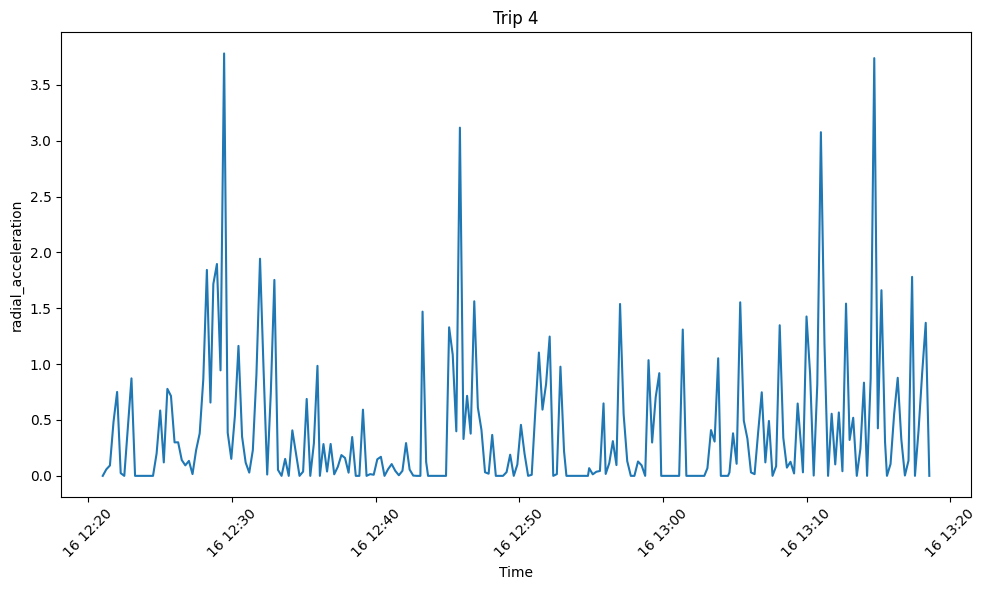

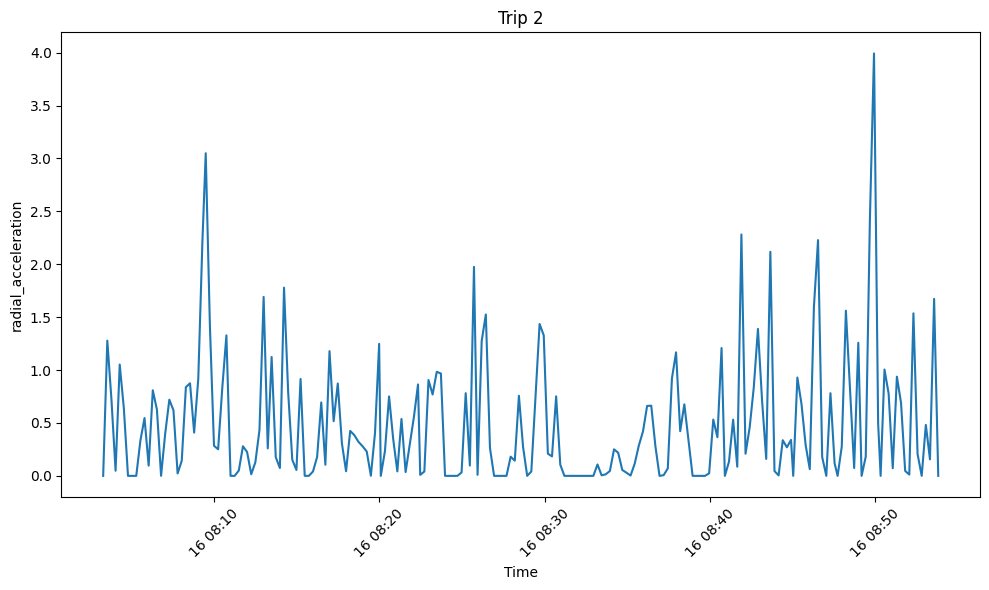

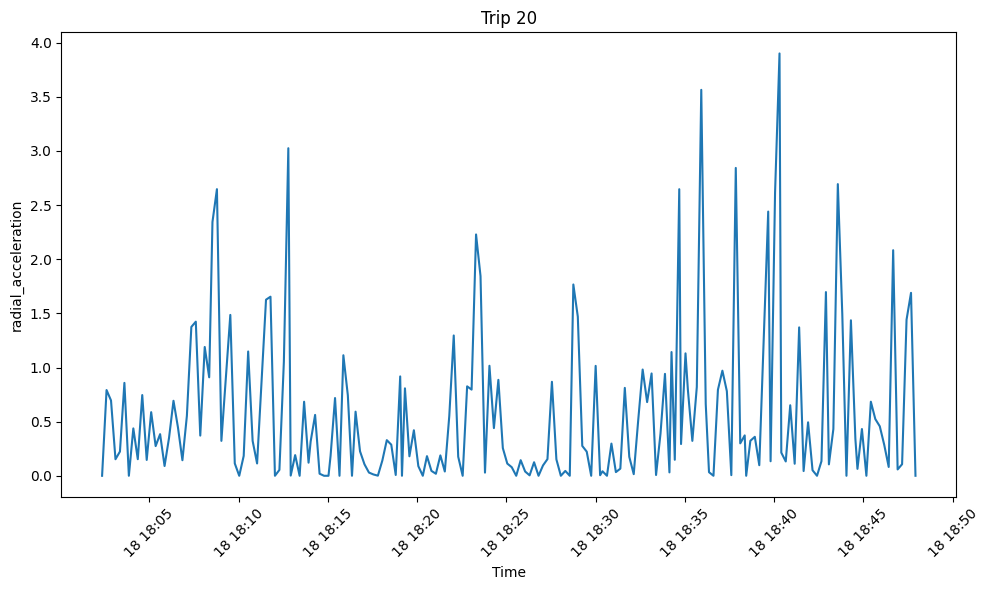

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have 'data' DataFrame containing bus data

# Convert 'devicetime' column to datetime
data['devicetime'] = pd.to_datetime(data['devicetime'])

# Draw a line graph of radial acceleration against time for a single trip
def draw_radial_acceleration_graph(trip_id):
    trip_df = data[data["trip_id"] == trip_id]
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    plt.plot(trip_df["devicetime"], trip_df["radial_acceleration"])
    plt.xlabel("Time")
    plt.ylabel("radial_acceleration")
    plt.title("Trip " + str(trip_id))
    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
    plt.tight_layout()  # Adjust layout for better formatting
    plt.show()

draw_radial_acceleration_graph(4)
draw_radial_acceleration_graph(2)
draw_radial_acceleration_graph(20)


In [21]:
data.head(20)

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration,radial_acceleration
0,574733099,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,POINT (184841.00784031872 232320.15459256113),NaN,2.0,1,0.323975,0.000000
1,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1,-0.251980,1.278067
2,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1,-0.179987,0.722300
3,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1,-0.251980,0.048332
4,574736662,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,POINT (184954.1363920236 232162.16484193364),101,2.0,1,0.359971,1.052222
5,574736663,116,2021-10-16 08:04:34,7.291210,80.637713,8.63931,2021-10-16,08:04:34,POINT (184982.64260533327 232114.61697960715),101,2.0,1,-0.035997,0.639311
6,574736664,116,2021-10-16 08:04:49,7.290943,80.638160,0.00000,2021-10-16,08:04:49,POINT (185031.9565310351 232085.11003064158),101,2.0,1,-0.575954,0.000000
7,574736665,116,2021-10-16 08:05:04,7.290943,80.638157,0.00000,2021-10-16,08:05:04,POINT (185031.58111776915 232085.11014168937),101,2.0,1,0.000000,0.000000
8,574736666,116,2021-10-16 08:05:19,7.290943,80.638157,0.00000,2021-10-16,08:05:19,POINT (185031.58111776915 232085.11014168937),101,2.0,1,0.000000,0.000000
9,574736667,116,2021-10-16 08:05:34,7.290752,80.638305,6.47948,2021-10-16,08:05:34,POINT (185047.9605390529 232063.90664561786),101,2.0,1,0.431965,0.333808


### Distance from start

In [22]:

pip install osmnx

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: osmnx in c:\python311\lib\site-packages (1.6.0)




[notice] A new release of pip available: 22.3.1 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


#### Cumalative addition of distance

In [23]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame named 'data' with columns: 'trip_id', 'latitude', 'longitude', and 'devicetime'
# Convert the 'devicetime' column to pandas Timestamp if it's not already
data['devicetime'] = pd.to_datetime(data['devicetime'])

# Function to calculate Haversine distance between two points
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371000  # Earth's radius in meters
    phi_1 = np.radians(lat1)
    phi_2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)

    a = np.sin(delta_phi / 2.0)**2 + np.cos(phi_1) * np.cos(phi_2) * np.sin(delta_lambda / 2.0)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    meters = R * c
    return meters

# Calculate the distance between consecutive rows within the same trip
data['distance'] = data.groupby('trip_id').apply(lambda group: haversine_distance(group['latitude'], group['longitude'], group['latitude'].shift(), group['longitude'].shift())).reset_index(level=0, drop=True)

# Calculate cumulative distance for each trip
data['cumulative_distance'] = data.groupby('trip_id')['distance'].cumsum()

print(data)


                id  deviceid          devicetime  latitude  longitude  \
0        574733099       116 2021-10-16 08:03:19  7.293068  80.636430   
1        574733100       116 2021-10-16 08:03:34  7.293043  80.637552   
2        574733101       116 2021-10-16 08:03:49  7.292725  80.637707   
3        574733102       116 2021-10-16 08:04:04  7.292292  80.637663   
4        574736662       116 2021-10-16 08:04:19  7.291640  80.637455   
...            ...       ...                 ...       ...        ...   
1259021  894788822      1719 2022-02-24 14:00:04  7.291628  80.635280   
1259022  895724319      1719 2022-02-24 18:03:00  7.291675  80.635278   
1259023  897183269      1719 2022-02-25 09:20:30  7.291665  80.635343   
1259024  898099616      1719 2022-02-25 13:15:43  7.291682  80.635215   
1259025  898917340      1719 2022-02-25 16:48:05  7.291622  80.635255   

            speed        date      time  \
0        14.03890  2021-10-16  08:03:19   
1        10.25920  2021-10-16  08:03:

In [24]:
# drop distance column and rename cumulative_distance to distance from start
data.drop(['distance'], axis=1, inplace=True)
data.rename(columns={'cumulative_distance': 'distance_from_start'}, inplace=True)


In [25]:
# fill nan with 0
data['distance_from_start'].fillna(0, inplace=True)

In [26]:
data

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration,radial_acceleration,distance_from_start
0,574733099,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,POINT (184841.00784031872 232320.15459256113),NaN,2.0,1,0.323975,0.000000,0.000000
1,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1,-0.251980,1.278067,123.738485
2,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1,-0.179987,0.722300,163.044397
3,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1,-0.251980,0.048332,211.472339
4,574736662,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,POINT (184954.1363920236 232162.16484193364),101,2.0,1,0.359971,1.052222,287.492821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1259021,894788822,1719,2022-02-24 14:00:04,7.291628,80.635280,9.71923,2022-02-24,14:00:04,POINT (184713.98228291195 232160.95408285945),BT01,15887.0,2,-0.001092,0.000000,0.000000
1259022,895724319,1719,2022-02-24 18:03:00,7.291675,80.635278,7.55940,2022-02-24,18:03:00,POINT (184713.79613721426 232166.11833986486),BT01,15889.0,2,0.000869,0.000000,0.000000
1259023,897183269,1719,2022-02-25 09:20:30,7.291665,80.635343,6.47948,2022-02-25,09:20:30,POINT (184720.9728106963 232165.01034694258),BT01,15890.0,2,-0.002883,0.000000,0.000000
1259024,898099616,1719,2022-02-25 13:15:43,7.291682,80.635215,8.09935,2022-02-25,13:15:43,POINT (184706.8070567022 232166.85029675177),BT01,15892.0,2,-0.001631,0.000000,0.000000


In [27]:
# save as csv file 
data.to_csv('../DataOut/bus_trip_all_points_with_acceleration_and_radial_acceleration_and_distance.csv', index=False)

## Get Accelaration and Breaks

In [28]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame named 'data' with columns: 'acceleration', 'devicetime', and 'trip_id'
# Convert the 'devicetime' column to pandas Timestamp if it's not already
data['devicetime'] = pd.to_datetime(data['devicetime'])

# Calculate time difference between consecutive rows within the same trip
data['time_diff'] = data.groupby('trip_id')['devicetime'].diff()

# Calculate change in acceleration between consecutive rows within the same trip
data['acc_diff'] = data.groupby('trip_id')['acceleration'].diff()

# Filter out rows with time differences close to zero
data = data[data['time_diff'].dt.total_seconds() > 0.001]  # Adjust the threshold as needed

# Calculate acceleration by dividing acceleration difference by time difference (avoiding division by zero)
data['acceleration_der'] = data['acc_diff'] / data['time_diff'].dt.total_seconds()

# Handle the case where time difference is zero or very close to zero, set acceleration_der to 0
data['acceleration_der'].replace([np.inf, -np.inf], np.nan, inplace=True)
data['acceleration_der'].fillna(0, inplace=True)

data


C:\Users\gw\AppData\Local\Temp\ipykernel_53760\4187010655.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['acceleration_der'] = data['acc_diff'] / data['time_diff'].dt.total_seconds()
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\4187010655.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['acceleration_der'].replace([np.inf, -np.inf], np.nan, inplace=True)
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\4187010655.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentat

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration,radial_acceleration,distance_from_start,time_diff,acc_diff,acceleration_der
1,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1,-0.251980,1.278067,123.738485,0 days 00:00:15,-0.575955,-0.038397
2,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1,-0.179987,0.722300,163.044397,0 days 00:00:15,0.071993,0.004800
3,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1,-0.251980,0.048332,211.472339,0 days 00:00:15,-0.071993,-0.004800
4,574736662,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,POINT (184954.1363920236 232162.16484193364),101,2.0,1,0.359971,1.052222,287.492821,0 days 00:00:15,0.611951,0.040797
5,574736663,116,2021-10-16 08:04:34,7.291210,80.637713,8.63931,2021-10-16,08:04:34,POINT (184982.64260533327 232114.61697960715),101,2.0,1,-0.035997,0.639311,343.141212,0 days 00:00:15,-0.395969,-0.026398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253852,1310926397,262,2022-08-09 10:55:05,7.290370,80.638812,20.51840,2022-08-09,10:55:05,POINT (185103.88471817068 232021.69189563429),NaN,5586.0,2,-0.539900,4.312238,16062.472333,0 days 00:00:01,-0.694171,-0.694171
1253853,1310926396,262,2022-08-09 10:55:37,7.291380,80.637410,7.55940,2022-08-09,10:55:37,POINT (184949.15914480377 232133.4259444512),NaN,5586.0,2,-0.404969,0.096588,16253.551165,0 days 00:00:32,0.134931,0.004217
1253854,1310926395,262,2022-08-09 10:55:38,7.291392,80.637387,7.55940,2022-08-09,10:55:38,POINT (184946.57580228115 232134.70946937904),NaN,5586.0,2,0.000000,0.588683,16256.436454,0 days 00:00:01,0.404969,0.404969
1253855,1310926393,262,2022-08-09 10:55:53,7.291295,80.636463,12.95900,2022-08-09,10:55:53,POINT (184844.62591334787 232124.05764201845),NaN,5586.0,2,0.359973,0.563965,16358.837456,0 days 00:00:15,0.359973,0.023998


In [29]:
# save as csv file 
data.to_csv('../DataOut/bus_trip_all_points_with_acceleration_and_radial_acceleration_and_distance_and_accDiff.csv', index=False)

In [30]:
# Draw a line graph of radial acceleration against time for a single trip
def drawAgainst(data,trip_id,columnx,columny):
    trip_df = data[data["trip_id"] == trip_id]
    plt.figure(figsize=(10, 6))  # Adjust figure size as needed
    plt.plot(trip_df[f"{columnx}"], trip_df[f"{columny}"])
    plt.xlabel(f"{columnx}")
    plt.ylabel(f"{columny}")
    plt.title("Trip " + str(trip_id))
    plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
    plt.tight_layout()  # Adjust layout for better formatting
    plt.show()


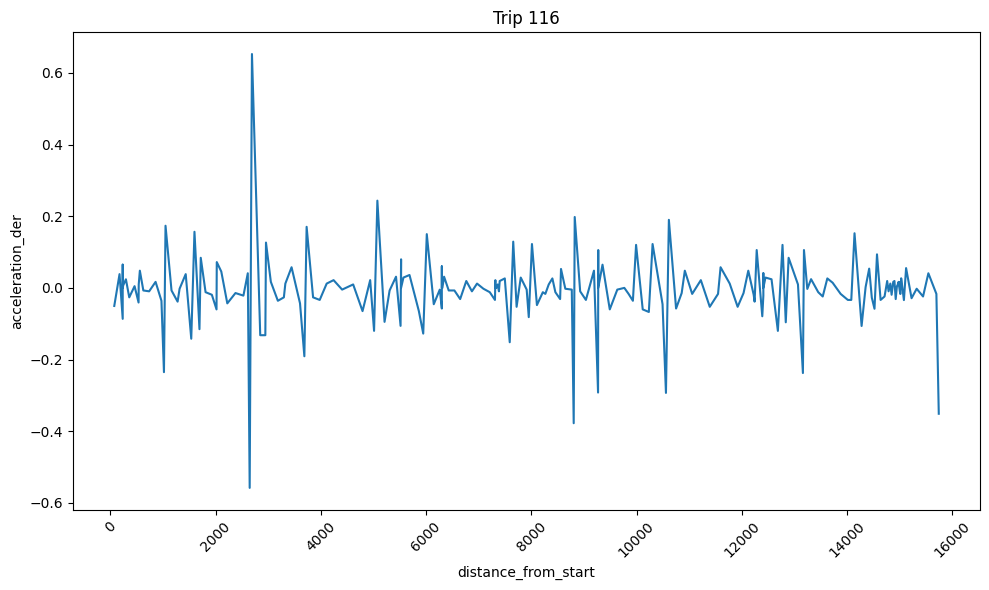

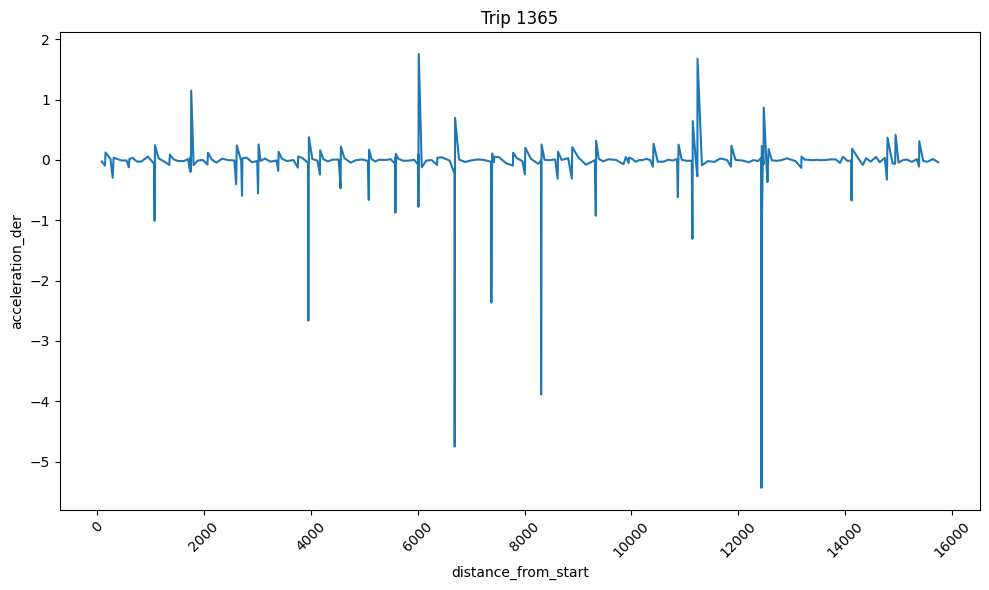

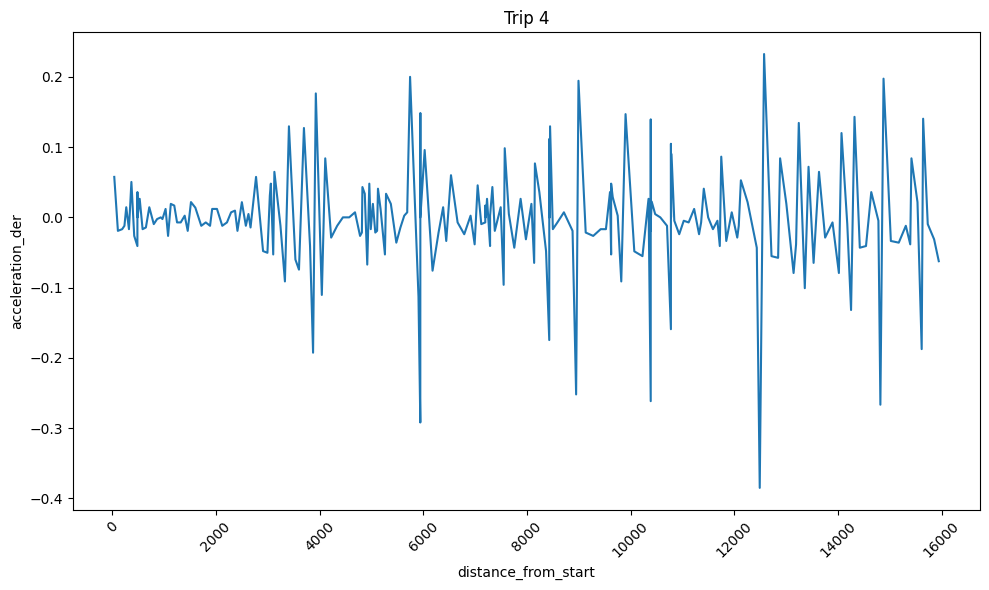

In [31]:
drawAgainst(data,116,'distance_from_start','acceleration_der')
drawAgainst(data,1365,'distance_from_start','acceleration_der')
drawAgainst(data,4,'distance_from_start','acceleration_der')

In [32]:
data.describe()

,id,deviceid,devicetime,latitude,longitude,speed,trip_id,direction,acceleration,radial_acceleration,distance_from_start,time_diff,acc_diff,acceleration_der
count,1.243135e+06,1.243135e+06,1243135,1.243135e+06,1.243135e+06,1.243135e+06,1.243135e+06,1.243135e+06,1.243135e+06,1.243135e+06,1.243135e+06,1243135,1.243135e+06,1.243135e+06
mean,9.226751e+08,1.534471e+02,2022-03-14 11:00:18.267462912,7.287397e+00,8.068034e+01,8.911606e+00,2.816023e+03,1.497387e+00,-2.019596e-01,4.645630e-01,8.114678e+03,0 days 00:00:14.750698838,-2.679638e-03,-5.709868e-02
min,5.601999e+08,1.160000e+02,2021-10-01 06:40:19,6.890040e+00,7.989510e+01,0.000000e+00,1.000000e+00,1.000000e+00,-2.537799e+01,0.000000e+00,0.000000e+00,0 days 00:00:01,-3.545719e+01,-3.545719e+01
25%,6.454891e+08,1.170000e+02,2021-12-05 17:35:55.500000,7.282678e+00,8.064853e+01,2.699780e+00,1.446000e+03,1.000000e+00,-3.599733e-01,7.863608e-03,3.456153e+03,0 days 00:00:10,-7.919427e-01,-5.759538e-02
50%,7.778989e+08,1.230000e+02,2022-01-21 12:00:18,7.287517e+00,8.067738e+01,8.639310e+00,2.824000e+03,1.000000e+00,7.199333e-02,1.696899e-01,7.684458e+03,0 days 00:00:15,-1.079913e-01,-7.199448e-03
75%,1.299012e+09,1.280000e+02,2022-08-04 14:31:32.500000,7.291193e+00,8.071305e+01,1.457880e+01,4.187000e+03,2.000000e+00,4.319627e-01,6.224172e-01,1.210581e+04,0 days 00:00:15,5.474668e-01,3.359733e-02
max,1.546639e+09,2.620000e+02,2022-10-31 21:36:16,7.557048e+00,8.077668e+01,5.885530e+01,5.587000e+03,2.000000e+00,2.213824e+01,5.223148e+01,2.112802e+05,0 days 05:51:12,2.537798e+01,2.290555e+01
std,3.366444e+08,5.768012e+01,NaN,1.104307e-02,3.630886e-02,7.155228e+00,1.595620e+03,4.999934e-01,1.270411e+00,7.339973e-01,7.243536e+03,0 days 00:00:45.088783365,1.861781e+00,8.007287e-01


## Check whether the time or distance is better

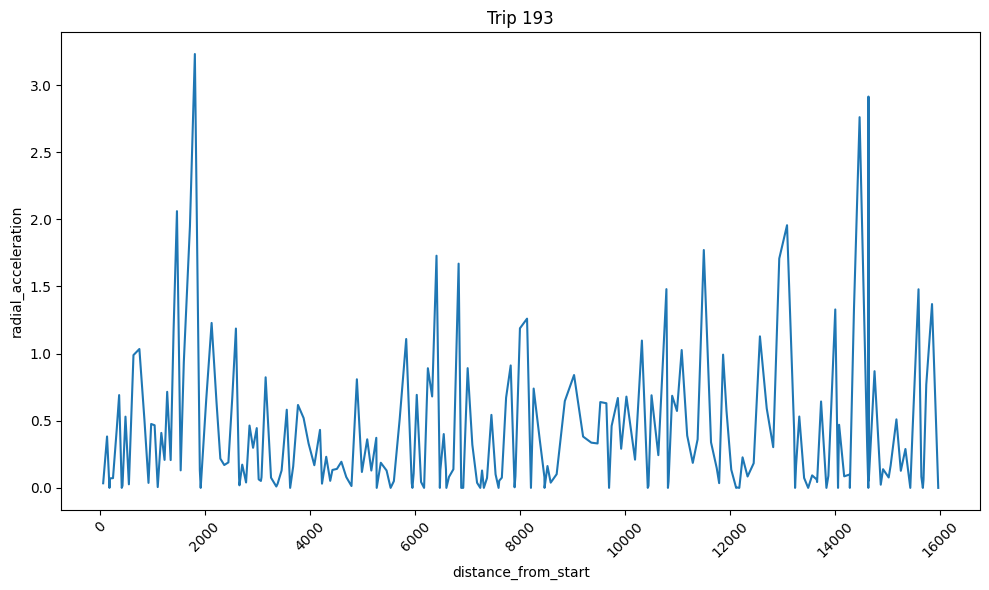

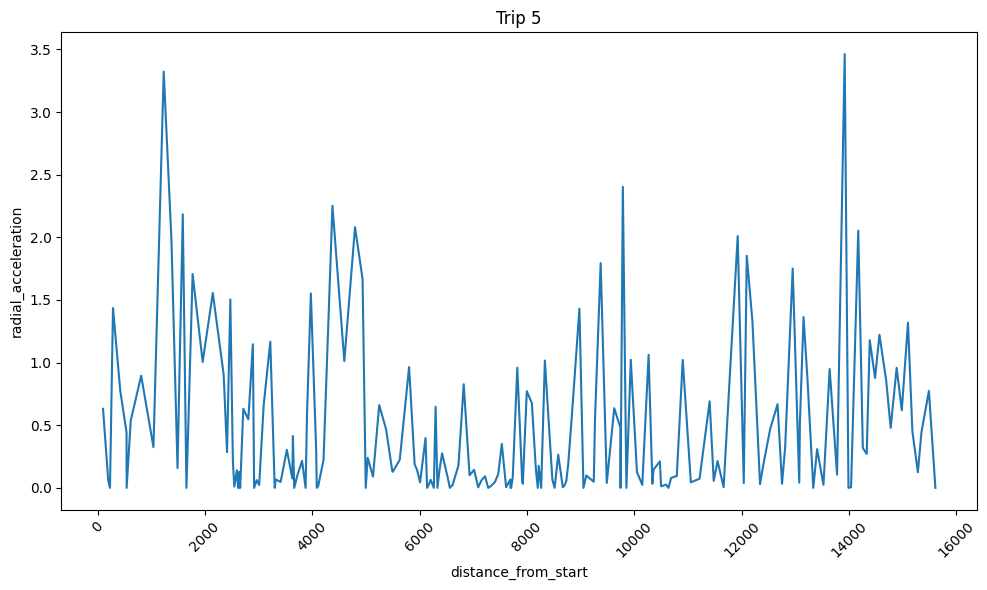

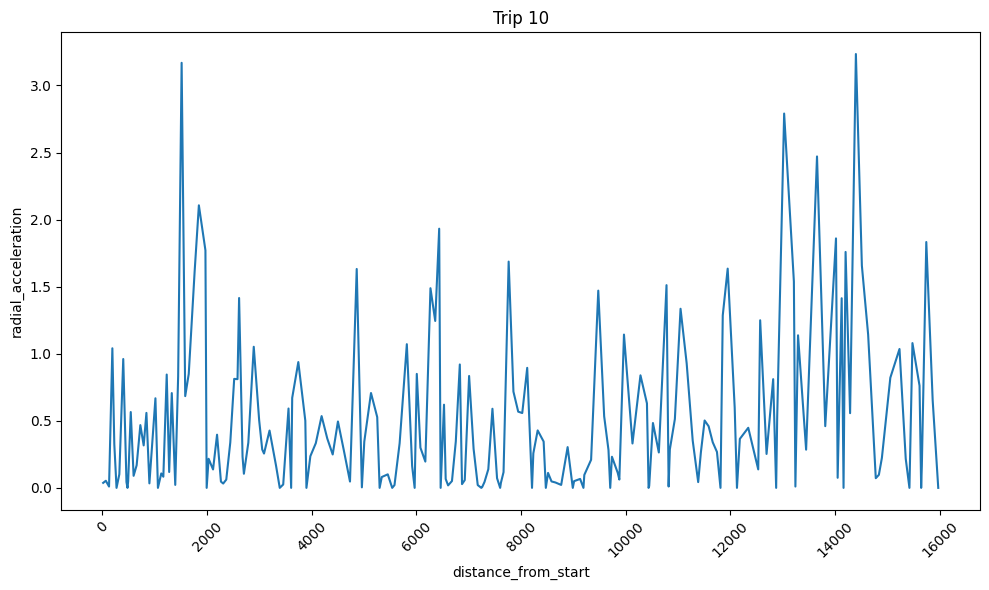

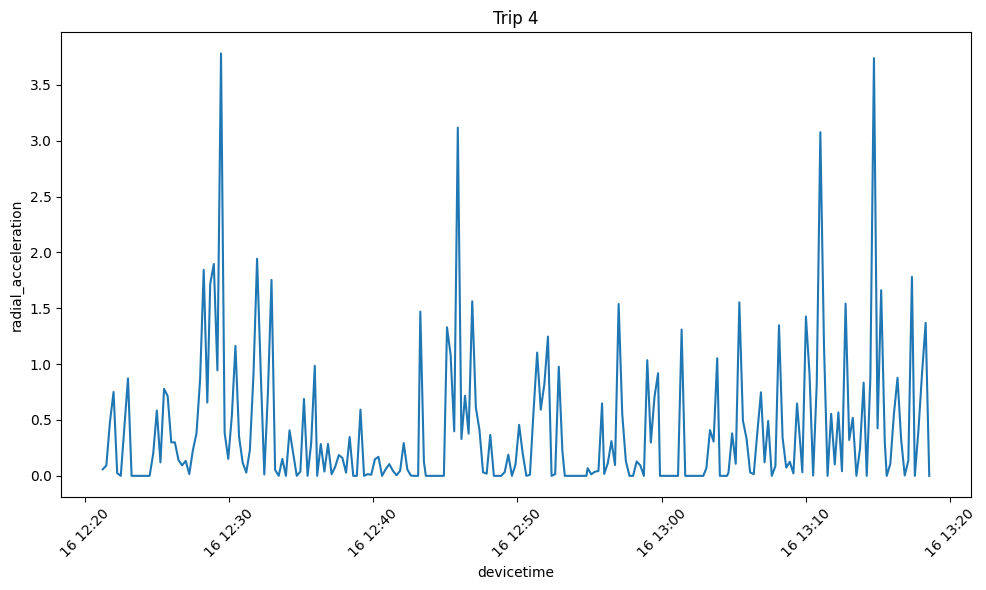

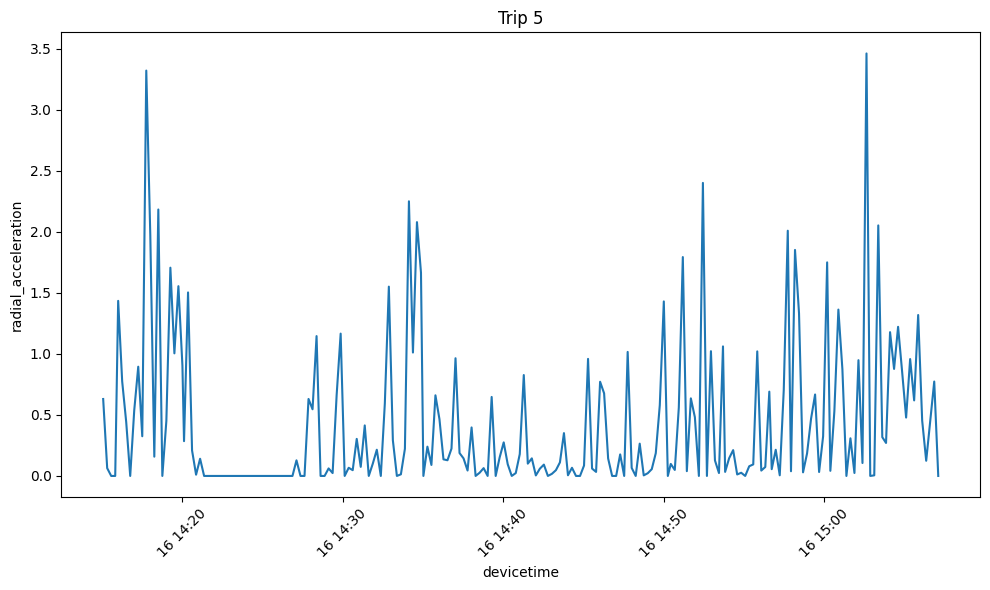

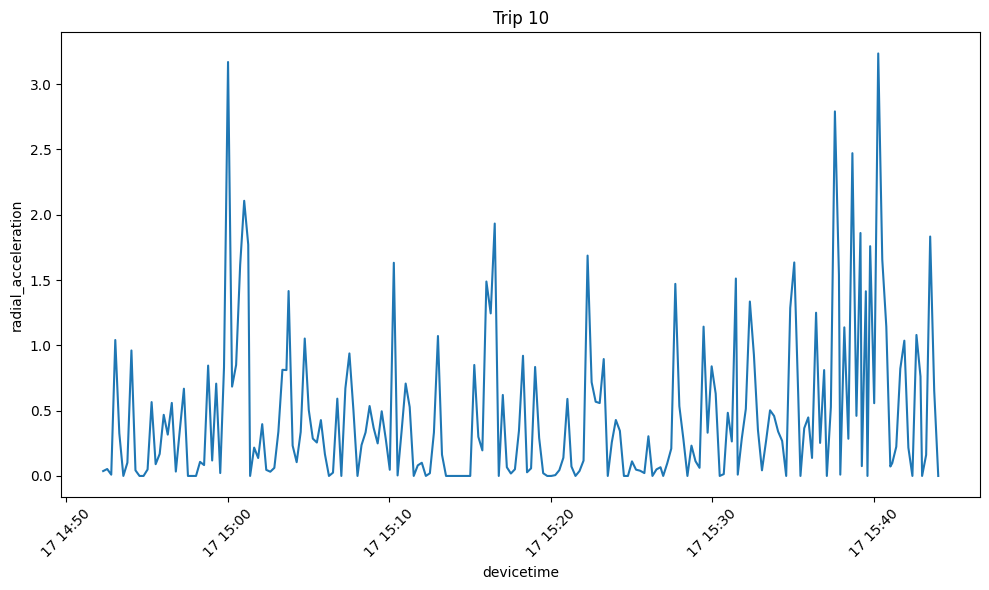

In [33]:
drawAgainst(data,193,'distance_from_start','radial_acceleration')
drawAgainst(data,5,'distance_from_start','radial_acceleration')
drawAgainst(data,10,'distance_from_start','radial_acceleration')

print("=========================================================")

drawAgainst(data,4,'devicetime','radial_acceleration')
drawAgainst(data,5,'devicetime','radial_acceleration')
drawAgainst(data,10,'devicetime','radial_acceleration')

Seem like distance is better

## Cluster Test

In [ ]:
data = pd.read_csv('../DataOut/bus_trip_all_points_with_acceleration_and_radial_acceleration_and_distance_and_accDiff.csv')

In [34]:
datain_one_direction=data[data['direction']==1]
data_to_cluster=datain_one_direction[['trip_id','deviceid','speed','acceleration','radial_acceleration','acceleration_der']]

In [35]:

# from sklearn.preprocessing import LabelEncoder

# # Initialize the LabelEncoder
# label_encoder = LabelEncoder()

# # Fit and transform the 'bus_stop' column
# data_to_cluster['bus_stop'] = label_encoder.fit_transform(data_to_cluster['bus_stop'])

# # Display the encoded DataFrame
# print(data_to_cluster)


In [36]:
data_to_cluster

,trip_id,deviceid,speed,acceleration,radial_acceleration,acceleration_der
1,2.0,116,10.25920,-0.251980,1.278067,-0.038397
2,2.0,116,7.55940,-0.179987,0.722300,0.004800
3,2.0,116,3.77970,-0.251980,0.048332,-0.004800
4,2.0,116,9.17927,0.359971,1.052222,0.040797
5,2.0,116,8.63931,-0.035997,0.639311,-0.026398
...,...,...,...,...,...,...
627623,5587.0,262,2.15983,-0.057853,0.017268,-0.014922
627624,5587.0,262,2.15983,0.000000,0.050073,0.001653
627625,5587.0,262,2.69978,0.539950,0.056444,0.539950
627626,5587.0,262,5.39957,0.674947,0.062833,0.033749


In [37]:
# group by device_id by getting the mean value of speed
# data_to_cluster_mean=data_to_cluster.groupby('deviceid')['speed'].mean().reset_index()

# reset index
data_to_cluster=data_to_cluster.reset_index(drop=True)

features_only_df = data_to_cluster[['speed', 'acceleration', 'radial_acceleration','acceleration_der']]


In [38]:
features_only_df

,speed,acceleration,radial_acceleration,acceleration_der
0,10.25920,-0.251980,1.278067,-0.038397
1,7.55940,-0.179987,0.722300,0.004800
2,3.77970,-0.251980,0.048332,-0.004800
3,9.17927,0.359971,1.052222,0.040797
4,8.63931,-0.035997,0.639311,-0.026398
...,...,...,...,...
624811,2.15983,-0.057853,0.017268,-0.014922
624812,2.15983,0.000000,0.050073,0.001653
624813,2.69978,0.539950,0.056444,0.539950
624814,5.39957,0.674947,0.062833,0.033749


In [39]:
# print all the column names
print(features_only_df.columns)

Index(['speed', 'acceleration', 'radial_acceleration', 'acceleration_der'], dtype='object')


In [40]:
# from sklearn.cluster import KMeans
# import matplotlib.pyplot as plt

# # Assuming you have your preprocessed data in 'data_to_cluster_mean'

# # List to store distortion values
# distortions = []

# # Choose a range of cluster counts to try
# cluster_range = range(1, 11)

# # Calculate distortion for each cluster count
# for num_clusters in cluster_range:
#     kmeans = KMeans(n_clusters=num_clusters, random_state=0)
#     kmeans.fit(data_to_cluster_mean)
#     distortions.append(kmeans.inertia_)  # Inertia is the sum of squared distances to the nearest cluster center

# # Plot the elbow curve
# plt.plot(cluster_range, distortions, marker='o')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Distortion')
# plt.title('Elbow Method')
# plt.show()


In [41]:
# get the number of Nan values in each column
print(features_only_df.isna().sum())

speed                  0
acceleration           0
radial_acceleration    0
acceleration_der       0
dtype: int64


c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


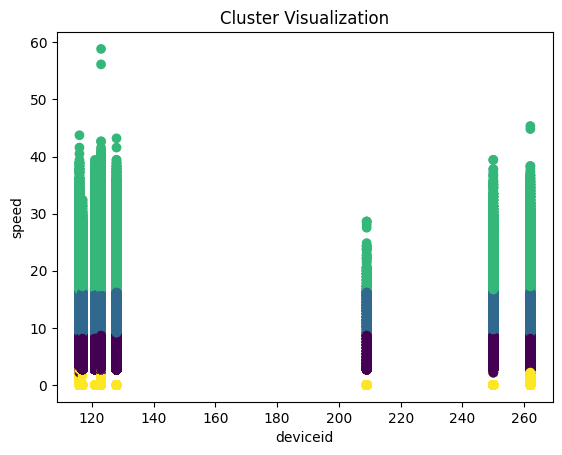

In [42]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Choose the number of clusters
num_clusters = 4

# Initialize the clustering algorithm
kmeans = KMeans(n_clusters=num_clusters, random_state=0)

# Fit the algorithm to your data
kmeans.fit(features_only_df)

# Get cluster assignments for each data point
cluster_labels = kmeans.labels_

# Get cluster centers (centroids)
cluster_centers = kmeans.cluster_centers_

# Add cluster labels to your original dataset
data_with_clusters = pd.DataFrame(features_only_df, columns=['speed', 'acceleration', 'radial_acceleration','acceleration_der'])
data_with_clusters['cluster'] = cluster_labels
data_with_clusters['deviceid'] = data_to_cluster['deviceid']  # Add 'deviceid' column from data_to_cluster
data_with_clusters['trip_id'] = data_to_cluster['trip_id']  

# Visualize the clusters (for 2D data)
plt.scatter(data_with_clusters['deviceid'], data_with_clusters['speed'], c=cluster_labels, cmap='viridis')
plt.xlabel('deviceid')
plt.ylabel('speed')
plt.title('Cluster Visualization')
plt.show()


In [43]:
def draw_clusters(data_with_clusters,x_axis,y_axis):
    # Visualize the clusters (for 2D data)
    plt.scatter(data_with_clusters[x_axis], data_with_clusters[y_axis], c=cluster_labels, cmap='viridis')
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='X', s=100, c='red')
    plt.xlabel(x_axis)
    plt.ylabel(y_axis)
    plt.title('Cluster Visualization')
    plt.show()


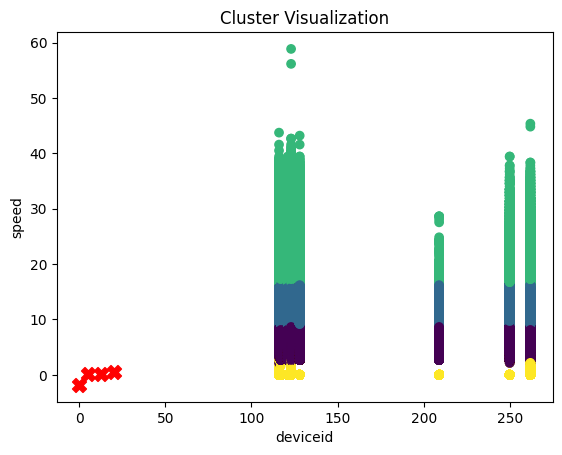

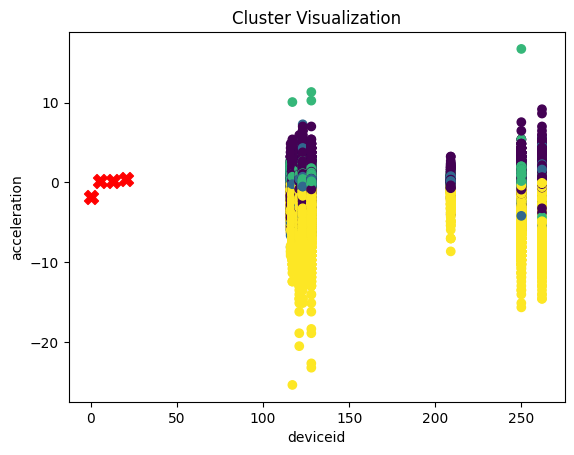

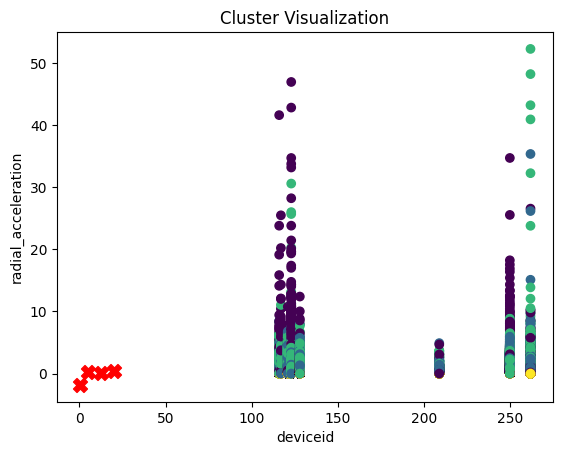

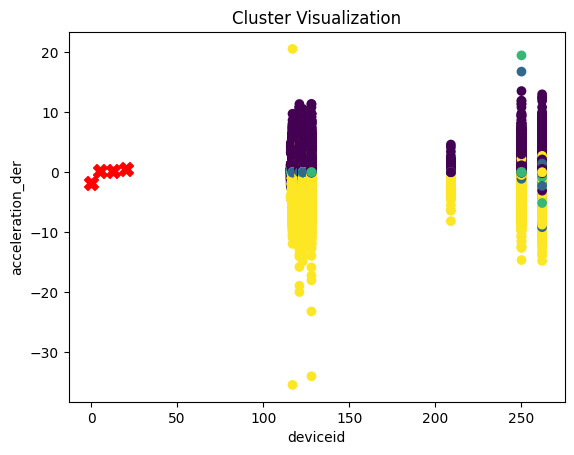

In [44]:
draw_clusters(data_with_clusters,'deviceid','speed')
draw_clusters(data_with_clusters,'deviceid','acceleration')
draw_clusters(data_with_clusters,'deviceid','radial_acceleration')
draw_clusters(data_with_clusters,'deviceid','acceleration_der')

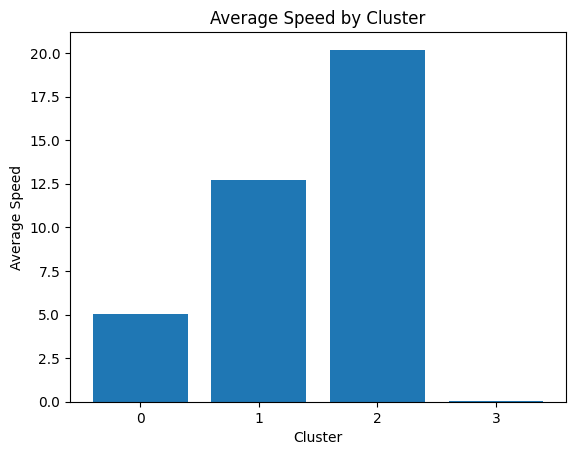

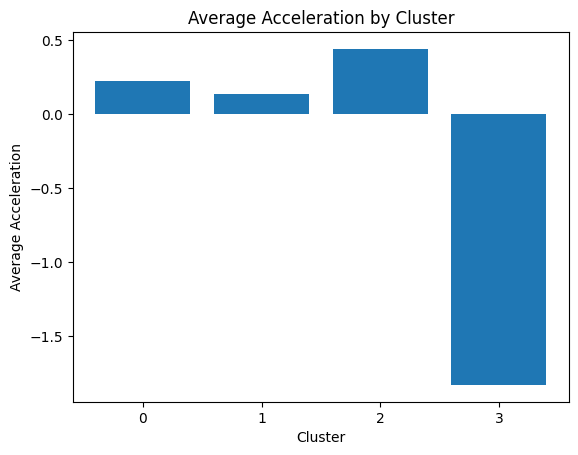

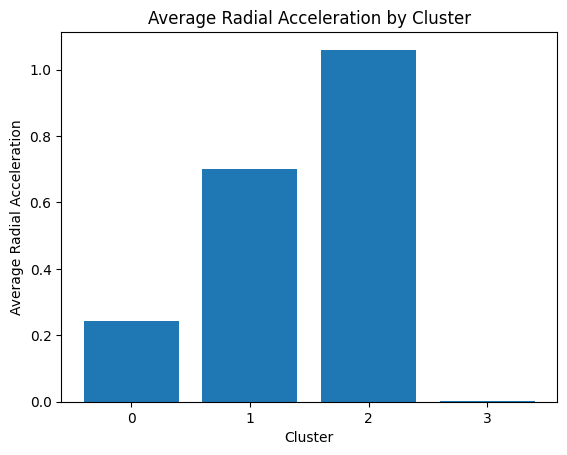

In [45]:
import matplotlib.pyplot as plt

# Calculate average values for each cluster
average_values = data_with_clusters.groupby('cluster').mean()

# Plot bar graph for Average Speed
plt.bar(average_values.index, average_values['speed'])
plt.xlabel('Cluster')
plt.ylabel('Average Speed')
plt.title('Average Speed by Cluster')
plt.xticks(average_values.index)
plt.show()

# Plot bar graph for Average Acceleration
plt.bar(average_values.index, average_values['acceleration'])
plt.xlabel('Cluster')
plt.ylabel('Average Acceleration')
plt.title('Average Acceleration by Cluster')
plt.xticks(average_values.index)
plt.show()

# Plot bar graph for Average Radial Acceleration
plt.bar(average_values.index, average_values['radial_acceleration'])
plt.xlabel('Cluster')
plt.ylabel('Average Radial Acceleration')
plt.title('Average Radial Acceleration by Cluster')
plt.xticks(average_values.index)
plt.show()


In [46]:
# create a dataframe group by device id and taking the mode of cluster column in data_with_clusters dataframe
cluster_df=data_with_clusters.groupby('deviceid')['cluster'].agg(pd.Series.mode).reset_index()

In [47]:
data_with_clusters

,speed,acceleration,radial_acceleration,acceleration_der,cluster,deviceid,trip_id
0,10.25920,-0.251980,1.278067,-0.038397,1,116,2.0
1,7.55940,-0.179987,0.722300,0.004800,0,116,2.0
2,3.77970,-0.251980,0.048332,-0.004800,0,116,2.0
3,9.17927,0.359971,1.052222,0.040797,1,116,2.0
4,8.63931,-0.035997,0.639311,-0.026398,0,116,2.0
...,...,...,...,...,...,...,...
624811,2.15983,-0.057853,0.017268,-0.014922,3,262,5587.0
624812,2.15983,0.000000,0.050073,0.001653,3,262,5587.0
624813,2.69978,0.539950,0.056444,0.539950,0,262,5587.0
624814,5.39957,0.674947,0.062833,0.033749,0,262,5587.0


In [48]:
cluster_df


,deviceid,cluster
0,116,1
1,117,0
2,121,0
3,123,0
4,128,0
5,209,0
6,250,0
7,262,0


In [49]:
data

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration,radial_acceleration,distance_from_start,time_diff,acc_diff,acceleration_der
1,574733100,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,POINT (184964.84865244984 232317.35306792473),NaN,2.0,1,-0.251980,1.278067,123.738485,0 days 00:00:15,-0.575955,-0.038397
2,574733101,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,POINT (184981.95255171193 232282.14959255166),NaN,2.0,1,-0.179987,0.722300,163.044397,0 days 00:00:15,0.071993,0.004800
3,574733102,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,POINT (184977.15733984314 232234.22458233108),NaN,2.0,1,-0.251980,0.048332,211.472339,0 days 00:00:15,-0.071993,-0.004800
4,574736662,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,POINT (184954.1363920236 232162.16484193364),101,2.0,1,0.359971,1.052222,287.492821,0 days 00:00:15,0.611951,0.040797
5,574736663,116,2021-10-16 08:04:34,7.291210,80.637713,8.63931,2021-10-16,08:04:34,POINT (184982.64260533327 232114.61697960715),101,2.0,1,-0.035997,0.639311,343.141212,0 days 00:00:15,-0.395969,-0.026398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253852,1310926397,262,2022-08-09 10:55:05,7.290370,80.638812,20.51840,2022-08-09,10:55:05,POINT (185103.88471817068 232021.69189563429),NaN,5586.0,2,-0.539900,4.312238,16062.472333,0 days 00:00:01,-0.694171,-0.694171
1253853,1310926396,262,2022-08-09 10:55:37,7.291380,80.637410,7.55940,2022-08-09,10:55:37,POINT (184949.15914480377 232133.4259444512),NaN,5586.0,2,-0.404969,0.096588,16253.551165,0 days 00:00:32,0.134931,0.004217
1253854,1310926395,262,2022-08-09 10:55:38,7.291392,80.637387,7.55940,2022-08-09,10:55:38,POINT (184946.57580228115 232134.70946937904),NaN,5586.0,2,0.000000,0.588683,16256.436454,0 days 00:00:01,0.404969,0.404969
1253855,1310926393,262,2022-08-09 10:55:53,7.291295,80.636463,12.95900,2022-08-09,10:55:53,POINT (184844.62591334787 232124.05764201845),NaN,5586.0,2,0.359973,0.563965,16358.837456,0 days 00:00:15,0.359973,0.023998


In [50]:
# in data dataframe, select all the raws within a given date around a 5 minitues time interval around a given time
data['devicetime']=pd.to_datetime(data['devicetime'])

# Given date and time
given_date = '2021-10-16'
given_time = '08:03:04'

# Convert given time to datetime format
given_datetime = pd.to_datetime('2021-10-27 14:50:45')

# Calculate time range for the interval
time_range = pd.to_timedelta('1 minutes')

# Filter rows within the time interval around the given time
selected_rows = data[
    (data['devicetime'] >= (given_datetime - time_range)) &
    (data['devicetime'] <= (given_datetime + time_range))
]




C:\Users\gw\AppData\Local\Temp\ipykernel_53760\259650801.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['devicetime']=pd.to_datetime(data['devicetime'])


In [51]:
selected_rows

,id,deviceid,devicetime,latitude,longitude,speed,date,time,geometry,bus_stop,trip_id,direction,acceleration,radial_acceleration,distance_from_start,time_diff,acc_diff,acceleration_der


## Time serious cluster test

C:\Users\gw\AppData\Local\Temp\ipykernel_53760\4013257159.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['devicetime'] = pd.to_datetime(data['devicetime'])
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\4013257159.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['devicetime_seconds'] = (data['devicetime'] - data['devicetime'].min()).dt.total_seconds()


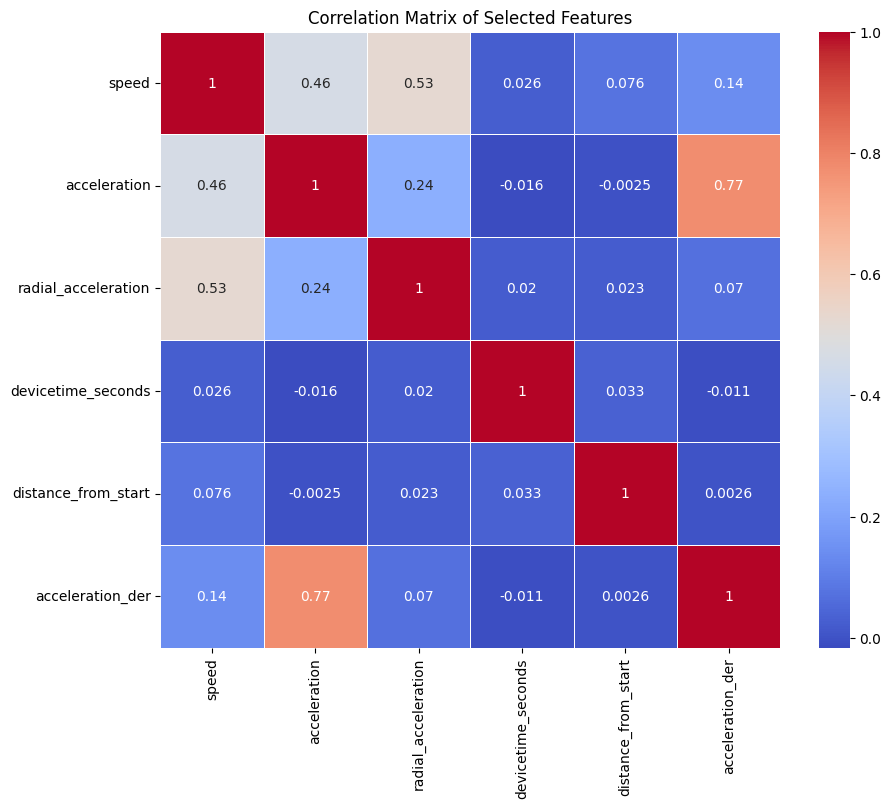

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset (assuming it's named 'data')
# data = pd.read_csv('your_dataset.csv')

# Convert 'devicetime' to pandas Timestamp
data['devicetime'] = pd.to_datetime(data['devicetime'])

# Convert 'devicetime' to seconds
data['devicetime_seconds'] = (data['devicetime'] - data['devicetime'].min()).dt.total_seconds()

# Select the features for correlation matrix
selected_features = ['speed', 'acceleration', 'radial_acceleration', 'devicetime_seconds','distance_from_start','acceleration_der']

# Calculate the correlation matrix
correlation_matrix = data[selected_features].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title("Correlation Matrix of Selected Features")
plt.show()


In [53]:
from sklearn.preprocessing import StandardScaler

# Create empty lists to store trip IDs and dataframes
processed_trip_ids = []
dataframes_without_trip_id = []

# Iterate through each unique trip_id
for trip_id in datain_one_direction['trip_id'].unique():
    # Filter the data for the current trip_id
    trip_data = datain_one_direction[datain_one_direction['trip_id'] == trip_id].copy()
    
    # Remove the trip_id column from the current trip_data
    trip_data_without_id = trip_data[['devicetime', 'radial_acceleration','speed', 'acceleration','distance_from_start','acceleration_der']]
    
    # Ensure selected columns are numeric (e.g., exclude any object or string columns)
    numeric_columns = [ 'radial_acceleration','speed', 'acceleration','distance_from_start','acceleration_der']
    trip_data_without_id [numeric_columns]= trip_data_without_id[numeric_columns].astype(float)  # Convert to float data type
    
    # # Initialize the StandardScaler
    # scaler = StandardScaler()
    
    # columns_to_scale = ['radial_acceleration']

    # # Fit and transform the selected columns
    # trip_data_without_id[columns_to_scale] = scaler.fit_transform(trip_data_without_id[columns_to_scale])
    

    # Append the trip_id to the list
    processed_trip_ids.append(trip_id)
    
    # Append the dataframe without trip_id to the list
    dataframes_without_trip_id.append(trip_data_without_id)

# Print the processed trip IDs and the first few rows of each dataframe
for trip_id, df in zip(processed_trip_ids, dataframes_without_trip_id):
    print(f"Processed Trip ID: {trip_id}")
    print(df.head())  # Print the first few rows of the dataframe
    print("\n")


C:\Users\gw\AppData\Local\Temp\ipykernel_53760\2356392422.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trip_data_without_id [numeric_columns]= trip_data_without_id[numeric_columns].astype(float)  # Convert to float data type
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\2356392422.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trip_data_without_id [numeric_columns]= trip_data_without_id[numeric_columns].astype(float)  # Convert to float data type
C:\Users\gw\AppData\Local\Temp\ipykernel_53760

Processed Trip ID: 2.0
           devicetime  radial_acceleration     speed  acceleration  \
1 2021-10-16 08:03:34             1.278067  10.25920     -0.251980   
2 2021-10-16 08:03:49             0.722300   7.55940     -0.179987   
3 2021-10-16 08:04:04             0.048332   3.77970     -0.251980   
4 2021-10-16 08:04:19             1.052222   9.17927      0.359971   
5 2021-10-16 08:04:34             0.639311   8.63931     -0.035997   

   distance_from_start  acceleration_der  
1           123.738485         -0.038397  
2           163.044397          0.004800  
3           211.472339         -0.004800  
4           287.492821          0.040797  
5           343.141212         -0.026398  


Processed Trip ID: 4.0
             devicetime  radial_acceleration    speed  acceleration  \
207 2021-10-16 12:21:15             0.058599  7.01944      0.467963   
208 2021-10-16 12:21:30             0.092952  9.71923      0.179986   
209 2021-10-16 12:21:45             0.483596  8.63931     -0

In [54]:
dataframes_without_trip_id[1]

,devicetime,radial_acceleration,speed,acceleration,distance_from_start,acceleration_der
207,2021-10-16 12:21:15,0.058599,7.01944,0.467963,40.639631,0.057595
208,2021-10-16 12:21:30,0.092952,9.71923,0.179986,110.740656,-0.019198
209,2021-10-16 12:21:45,0.483596,8.63931,-0.071995,193.101564,-0.016799
210,2021-10-16 12:22:00,0.751005,4.85961,-0.251980,236.850009,-0.011999
211,2021-10-16 12:22:15,0.024231,4.31966,-0.035997,271.835124,0.014399
...,...,...,...,...,...,...
438,2021-10-16 13:17:33,0.000000,0.00000,-1.529875,15616.015197,-0.187485
439,2021-10-16 13:17:48,0.405917,8.63931,0.575954,15644.008931,0.140389
440,2021-10-16 13:18:03,0.916469,15.11880,0.431966,15733.065369,-0.009599
441,2021-10-16 13:18:18,1.369753,14.57880,-0.036000,15855.685329,-0.031198


In [55]:
# delete rows with duplicate distance_from_start values in each data frames in dataframes_without_trip_id list
for df in dataframes_without_trip_id:
    df.drop_duplicates(subset=['distance_from_start'], keep='first', inplace=True)

C:\Users\gw\AppData\Local\Temp\ipykernel_53760\2356658688.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates(subset=['distance_from_start'], keep='first', inplace=True)


In [56]:
df

,devicetime,radial_acceleration,speed,acceleration,distance_from_start,acceleration_der
627451,2022-08-09 13:01:12,0.000000,0.00000,-0.111715,167.379491,0.000138
627452,2022-08-09 13:01:44,0.098662,3.23974,0.101242,239.854001,0.006655
627453,2022-08-09 13:01:45,0.077312,2.69978,-0.539960,240.956955,-0.641202
627454,2022-08-09 13:02:18,0.000000,0.00000,-0.081812,429.791557,0.013883
627455,2022-08-09 13:02:24,0.068856,2.69978,0.449963,452.286937,0.088629
...,...,...,...,...,...,...
627623,2022-08-09 13:55:01,0.017268,2.15983,-0.057853,16959.169925,-0.014922
627624,2022-08-09 13:55:36,0.050073,2.15983,0.000000,17123.789768,0.001653
627625,2022-08-09 13:55:37,0.056444,2.69978,0.539950,17175.357332,0.539950
627626,2022-08-09 13:55:41,0.062833,5.39957,0.674947,17309.762484,0.033749


In [57]:
# Assuming dataframes_without_trip_id is a list of dataframes with 'devicetime' column
for df in dataframes_without_trip_id:
    df['devicetime'] = pd.to_datetime(df['devicetime'])  # Convert to datetime if not already
    
    # Calculate time difference in seconds since trip start
    df['devicetime'] = (df['devicetime'] - df['devicetime'].min()).dt.total_seconds()

    # Print the updated dataframe
    print(df)

     devicetime  radial_acceleration     speed  acceleration  \
1           0.0             1.278067  10.25920     -0.251980   
2          15.0             0.722300   7.55940     -0.179987   
3          30.0             0.048332   3.77970     -0.251980   
4          45.0             1.052222   9.17927      0.359971   
5          60.0             0.639311   8.63931     -0.035997   
..          ...                  ...       ...           ...   
201      2954.0             0.000000   0.00000     -0.791940   
202      2969.0             0.481587   7.55940      0.503960   
203      2984.0             0.155985  15.11880      0.503960   
204      2999.0             1.672843  18.35850      0.215980   
205      3014.0             0.000000   4.85961     -0.899926   

     distance_from_start  acceleration_der  
1             123.738485         -0.038397  
2             163.044397          0.004800  
3             211.472339         -0.004800  
4             287.492821          0.040797  
5     

C:\Users\gw\AppData\Local\Temp\ipykernel_53760\3500269481.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['devicetime'] = pd.to_datetime(df['devicetime'])  # Convert to datetime if not already
C:\Users\gw\AppData\Local\Temp\ipykernel_53760\3500269481.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['devicetime'] = (df['devicetime'] - df['devicetime'].min()).dt.total_seconds()


In [58]:
dataframes_without_trip_id[2].head(20)

,devicetime,radial_acceleration,speed,acceleration,distance_from_start,acceleration_der
444,0.0,0.207373,6.47948,0.431965,22.809853,0.059995
445,15.0,0.097039,5.93953,-0.035997,85.025496,-0.031197
446,30.0,0.014021,8.09935,0.143988,157.635054,0.011999
447,45.0,0.000000,0.00000,-0.539957,203.417153,-0.045596
448,60.0,0.888259,5.39957,0.359971,235.580231,0.059995
449,75.0,0.039453,4.31966,-0.071994,281.142239,-0.028798
450,90.0,0.410817,8.63931,0.287977,352.469453,0.023998
451,105.0,1.506472,9.71923,0.071995,417.108821,-0.014399
452,120.0,0.000000,0.00000,-0.647949,471.350128,-0.047996
453,135.0,0.000000,0.00000,0.000000,471.608731,0.043197


In [59]:
bus_trips

,trip_id,deviceid,date,start_terminal,end_terminal,direction,start_time,end_time,duration,duration_in_mins,day_of_week,hour_of_day
0,1.0,116,2021-10-16,BT02,BT01,2,07:08:31,07:53:04,0:44:33,44.550000,5,7
1,2.0,116,2021-10-16,BT01,BT02,1,08:03:04,08:53:48,0:50:44,50.733333,5,8
2,3.0,116,2021-10-16,BT02,BT01,2,10:50:19,11:44:43,0:54:24,54.400000,5,10
3,4.0,116,2021-10-16,BT01,BT02,1,12:20:45,13:18:33,0:57:48,57.800000,5,12
4,5.0,116,2021-10-16,BT02,BT01,2,14:14:36,15:07:05,0:52:29,52.483333,5,14
...,...,...,...,...,...,...,...,...,...,...,...,...
15886,15891.0,1719,2022-02-25,BT01,BT02,1,09:42:39,10:34:59,0:52:20,52.333333,4,9
15887,15892.0,1719,2022-02-25,BT02,BT01,2,12:20:33,13:15:43,0:55:10,55.166667,4,12
15888,15893.0,1719,2022-02-25,BT01,BT02,1,13:41:19,14:38:03,0:56:44,56.733333,4,13
15889,15894.0,1719,2022-02-25,BT02,BT01,2,16:00:04,16:48:05,0:48:01,48.016667,4,16


In [60]:
# sort bus_trips dataframe by duration_in_mins , in dessending order
bus_trips.sort_values(by=['duration_in_mins'], ascending=False, inplace=True)

In [61]:
bus_trips.head(40)

,trip_id,deviceid,date,start_terminal,end_terminal,direction,start_time,end_time,duration,duration_in_mins,day_of_week,hour_of_day
6369,6372.0,264,2022-02-26,BT02,BT01,2,05:55:06,23:15:05,17:19:59,1039.983333,5,5
3455,3456.0,123,2022-10-30,BT02,BT01,2,05:01:26,19:30:19,14:28:53,868.883333,6,5
15672,15677.0,1718,2022-01-28,BT01,BT02,1,07:00:04,20:51:27,13:51:23,831.383333,4,7
6421,6424.0,264,2022-09-22,BT02,BT01,2,06:02:32,18:55:13,12:52:41,772.683333,3,6
3786,3787.0,128,2021-12-18,BT02,BT01,2,07:40:45,19:22:33,11:41:48,701.800000,5,7
3310,3311.0,123,2022-09-26,BT01,BT02,1,06:37:56,17:51:22,11:13:26,673.433333,0,6
2121,2122.0,121,2022-08-25,BT01,BT02,1,04:43:41,15:47:08,11:03:27,663.450000,3,4
12215,12220.0,1166,2022-07-02,BT01,BT02,1,05:43:13,16:05:09,10:21:56,621.933333,5,5
12239,12244.0,1166,2022-07-12,BT02,BT01,2,08:24:07,18:15:54,9:51:47,591.783333,1,8
2148,2149.0,121,2022-09-05,BT01,BT02,1,04:38:37,13:53:36,9:14:59,554.983333,0,4


In [62]:
# #### Interpolate Device time #####


# import numpy as np
# import pandas as pd
# from scipy.interpolate import interp1d

# # Assume you have a list of dataframes with 'devicetime' and other features
# dataframes = dataframes_without_trip_id  # List of dataframes

# # Step 1: Identify the maximum time duration across all dataframes
# max_duration = max(df['devicetime'].max() for df in dataframes)

# # Step 2: Define a common time interval (e.g., 15 seconds)
# common_time_interval = 15

# # Create a new dataframe with uniform devicetime values
# new_time_values = np.arange(0, max_duration, common_time_interval)
# new_time_df = pd.DataFrame({'devicetime': new_time_values})

# # Step 3 and 4: Interpolate other features for each dataframe
# interpolated_dataframes = []
# for df in dataframes:
#     # Merge the new_time_df with the current dataframe based on 'devicetime'
#     merged_df = pd.merge(new_time_df, df, on='devicetime', how='left')
    
#     # Interpolate other features using linear interpolation
#     features_to_interpolate = df.columns.difference(['devicetime'])
#     for feature in features_to_interpolate:
#         interpolator = interp1d(merged_df['devicetime'], merged_df[feature], kind='linear', fill_value='extrapolate')
#         merged_df[feature] = interpolator(new_time_values)
#         #fill null values
#         merged_df[feature].fillna(0, inplace=True)
    
#     interpolated_dataframes.append(merged_df)

# # Now, interpolated_dataframes contains dataframes with uniform devicetime and interpolated features


In [63]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d

# Assume you have a list of dataframes with 'distance_from_start' and other features
dataframes = dataframes_without_trip_id  # List of dataframes

# Step 1: Identify the maximum distance_from_start value across all dataframes
max_distance = max(df['distance_from_start'].max() for df in dataframes)

# Step 2: Define a common distance interval (e.g., 100 meters)
common_distance_interval = 50

# Create a new dataframe with uniform distance_from_start values
new_distance_values = np.arange(0, max_distance, common_distance_interval)
new_distance_df = pd.DataFrame({'distance_from_start': new_distance_values})

# Step 3 and 4: Interpolate other features for each dataframe
interpolated_dataframes = []
for df in dataframes:
    # Merge the new_distance_df with the current dataframe based on 'distance_from_start'
    merged_df = pd.merge(new_distance_df, df, on='distance_from_start', how='left')
    
    # Interpolate other features using linear interpolation
    features_to_interpolate = df.columns.difference(['distance_from_start'])
    # Loop through the features and interpolate
    for feature in features_to_interpolate:
        interpolator = interp1d(df['distance_from_start'], df[feature], kind='linear', fill_value='extrapolate')
        interpolated_values = interpolator(new_distance_values)
        
        # Create a mask for values beyond the range of the original data
        mask = (new_distance_values < df['distance_from_start'].min()) | (new_distance_values > df['distance_from_start'].max())
        
        # Set values outside the original data range to 0
        interpolated_values[mask] = 0
        
        # Add the interpolated values as a new column to the merged_df
        merged_df[feature] = interpolated_values
        
    merged_df.drop(['devicetime'], axis=1, inplace=True)
    interpolated_dataframes.append(merged_df)

# Now, interpolated_dataframes contains dataframes with uniform distance_from_start and interpolated features


In [64]:
max_distance

82337.0434658419

In [65]:
max_distance = -1  # Initialize with a low value
max_distance_index = -1

for index, df in enumerate(dataframes):
    current_max = df['distance_from_start'].max()
    if current_max > max_distance:
        max_distance = current_max
        max_distance_index = index

print("Index of DataFrame with maximum distance:", max_distance_index)


Index of DataFrame with maximum distance: 1629


In [66]:
# processed_trip_ids[1665]

In [67]:
interpolated_dataframes[1]

,distance_from_start,radial_acceleration,speed,acceleration,acceleration_der
0,0.0,0.000000,0.000000,0.000000,0.000000
1,50.0,0.063186,7.379934,0.429510,0.047341
2,100.0,0.087689,9.305577,0.224109,-0.007432
3,150.0,0.279162,9.204460,0.059873,-0.018055
4,200.0,0.525762,8.043311,-0.100376,-0.016042
...,...,...,...,...,...
1642,82100.0,0.000000,0.000000,0.000000,0.000000
1643,82150.0,0.000000,0.000000,0.000000,0.000000
1644,82200.0,0.000000,0.000000,0.000000,0.000000
1645,82250.0,0.000000,0.000000,0.000000,0.000000


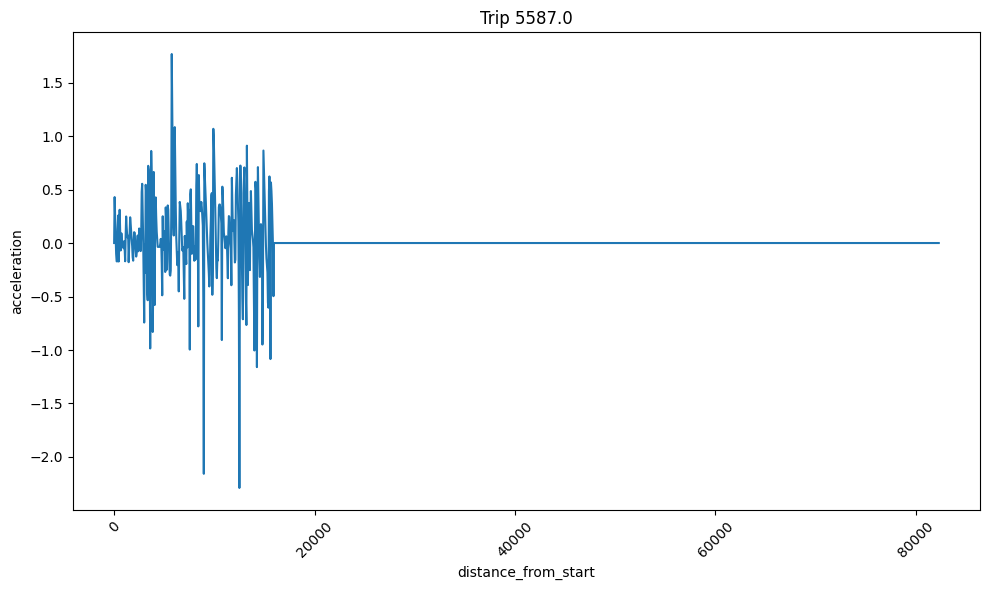

In [68]:
columnx='distance_from_start'
columny='acceleration'

trip_df = interpolated_dataframes[1]
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.plot(trip_df[f"{columnx}"], trip_df[f"{columny}"])
plt.xlabel(f"{columnx}")
plt.ylabel(f"{columny}")
plt.title("Trip " + str(trip_id))
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.tight_layout()  # Adjust layout for better formatting
plt.show()

In [69]:
interpolated_dataframes[23]

,distance_from_start,radial_acceleration,speed,acceleration,acceleration_der
0,0.0,0.000000,0.000000,0.000000,0.000000
1,50.0,0.030014,5.661390,0.290152,0.020797
2,100.0,0.051443,6.444581,0.081300,-0.017492
3,150.0,0.699868,7.949785,0.130806,-0.004822
4,200.0,1.160907,9.179270,0.148199,0.003809
...,...,...,...,...,...
1642,82100.0,0.000000,0.000000,0.000000,0.000000
1643,82150.0,0.000000,0.000000,0.000000,0.000000
1644,82200.0,0.000000,0.000000,0.000000,0.000000
1645,82250.0,0.000000,0.000000,0.000000,0.000000


In [70]:
len(interpolated_dataframes[1])

1647

In [71]:
# get the number of columns in dataframes_without_trip_id
num_columns = len(interpolated_dataframes[0].columns)
num_columns

5

In [72]:
# get a list of column names in interpolated_dataframes
column_namesInter = interpolated_dataframes[1].columns
#make it to a string list of names 
column_namesInter = column_namesInter.tolist()
column_namesInter

['distance_from_start',
 'radial_acceleration',
 'speed',
 'acceleration',
 'acceleration_der']

In [73]:
interpolated_dataframes[1]

,distance_from_start,radial_acceleration,speed,acceleration,acceleration_der
0,0.0,0.000000,0.000000,0.000000,0.000000
1,50.0,0.063186,7.379934,0.429510,0.047341
2,100.0,0.087689,9.305577,0.224109,-0.007432
3,150.0,0.279162,9.204460,0.059873,-0.018055
4,200.0,0.525762,8.043311,-0.100376,-0.016042
...,...,...,...,...,...
1642,82100.0,0.000000,0.000000,0.000000,0.000000
1643,82150.0,0.000000,0.000000,0.000000,0.000000
1644,82200.0,0.000000,0.000000,0.000000,0.000000
1645,82250.0,0.000000,0.000000,0.000000,0.000000


In [74]:
# pip install h5py

In [76]:
import numpy as np
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler

# Convert your list of dataframes to a 3D numpy array
n_ts = len(interpolated_dataframes)
sz = interpolated_dataframes[0].shape[0]
d = interpolated_dataframes[0].shape[1]
data_3d = np.array([df.values for df in interpolated_dataframes])

# Perform preprocessing on the data
X_train = TimeSeriesScalerMeanVariance().fit_transform(data_3d)
X_train = TimeSeriesResampler(sz=sz).fit_transform(X_train)
sz = X_train.shape[1]

# Perform TimeSeriesKMeans clustering
cluster_count = 4
seed = 1234
km = TimeSeriesKMeans(n_clusters=cluster_count,
                          n_init=4,
                          metric="dtw",
                          verbose=True,
                          max_iter_barycenter=24,
                          random_state=seed,
                          n_jobs=-1)
y_pred = km.fit_predict(X_train)



Init 1


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 1218 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 1768 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done 2418 tasks      | elapsed:   24.3s
[Parallel(n_jobs=-1)]: Done 2736 out of 2736 | elapsed:   27.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 1218 tasks      | elapsed:   11.8s
[Parallel(n_job

3185.694 --> 

In [ ]:
from tslearn.barycenters import dtw_barycenter_averaging

# Iterate through each feature and visualize the clusters
for feature_idx in range(X_train.shape[2]):
    plt.figure(figsize=(200, 100))
    for yi in range(cluster_count):
        plt.subplot(cluster_count, 1, yi + 1)
        for xx in X_train[y_pred == yi, :, feature_idx]:
            plt.plot(xx.ravel(), "k-", alpha=0.2)
        plt.plot(km.cluster_centers_[yi, :, feature_idx].ravel(), "r-")
        plt.xlim(0, sz)
        plt.ylim(-4, 4)
        plt.text(0.55, 0.85, f'Cluster {yi + 1}', transform=plt.gca().transAxes)
        if yi == 1:
            plt.title(f"Time Series K-Means Clustering for Feature {feature_idx + 1}")
    plt.tight_layout()
    plt.show()


In [ ]:
plt.figure(figsize=(200, 100))
plt.plot(km.cluster_centers_[5, :, feature_idx].ravel(), "r-")
plt.show()

### Cluster data Visualize

In [ ]:
type(y_pred)

In [ ]:
# convert processed_trip_ids to a numpy array
processed_trip_ids = np.array(processed_trip_ids)

In [ ]:
# create a data frame from processed_trip_ids and y_pred , and rename the columns to 'trip_id' and 'cluster'
trip_clusters = pd.DataFrame({'trip_id': processed_trip_ids, 'TScluster': y_pred})

In [ ]:
trip_clusters

In [ ]:
datain_one_direction

In [ ]:
data_with_clusters

In [ ]:
norm_clusters=pd.DataFrame({'trip_id': data_with_clusters['trip_id'], 'NormCluster': data_with_clusters['cluster']})

In [ ]:
norm_clusters

In [ ]:
from scipy import stats

norm_clusters = norm_clusters.groupby('trip_id')['NormCluster'].apply(lambda x: stats.mode(x)[0][0]).reset_index()
norm_clusters

In [ ]:
cluster_data = pd.DataFrame()

cluster_data = datain_one_direction[['trip_id', 'deviceid', 'speed', 'acceleration', 'radial_acceleration', 'distance_from_start']]

# Perform a left merge based on 'trip_id'
cluster_data = pd.merge(cluster_data, trip_clusters, on='trip_id', how='left')

cluster_data = pd.merge(cluster_data, norm_clusters, on='trip_id', how='left')

In [ ]:
cluster_data

In [ ]:
cluster_data.dropna(inplace=True)

In [ ]:
cluster_data.groupby('trip_id').mean()

In [ ]:
data_with_clusters

In [ ]:
#Group by 'TScluster' and calculate the mean of each feature
TSclusgrped=cluster_data.groupby('TScluster').mean()


# #Group by 'NormCluster' and calculate the mean of each feature
NormClustGrped=cluster_data.groupby('NormCluster').mean()


In [ ]:
TSclusgrped

In [ ]:
NormClustGrped

In [ ]:
average_values

In [ ]:
import matplotlib.pyplot as plt


# Calculate average values for each cluster
stat_vals = data_with_clusters.groupby('cluster').mean()

# stat_vals= cluster_data.groupby('TScluster').apply(lambda x: stats.mode(x)[0][0]).reset_index()

# stat_vals = cluster_data.groupby('TScluster').max().reset_index()



# Plot bar graph for Average Speed
plt.bar(stat_vals.index, stat_vals['speed'])
plt.xlabel('Cluster')
plt.ylabel('Average Speed')
plt.title('Average Speed by Cluster')
plt.xticks(stat_vals.index)
plt.show()

# Plot bar graph for Average Acceleration
plt.bar(stat_vals.index, stat_vals['acceleration'])
plt.xlabel('Cluster')
plt.ylabel('Average Acceleration')
plt.title('Average Acceleration by Cluster')
plt.xticks(stat_vals.index)
plt.show()

# Plot bar graph for Average Radial Acceleration
plt.bar(stat_vals.index, stat_vals['radial_acceleration'])
plt.xlabel('Cluster')
plt.ylabel('Average Radial Acceleration')
plt.title('Average Radial Acceleration by Cluster')
plt.xticks(stat_vals.index)
plt.show()

In [ ]:
data_with_clusters

In [ ]:
cluster_data

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named cluster_data
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# List of features to create box plots for
features = ['speed', 'acceleration', 'radial_acceleration']

for feature in features:
    plt.figure()
    sns.boxplot(x='TScluster', y=feature, data=cluster_data)
    plt.title(f'Box Plot of {feature} for Each Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature)
    plt.show()


In [ ]:
import matplotlib.pyplot as plt


# Calculate average values for each cluster
average_values = TSclusgrped

# Plot bar graph for Average Speed
plt.bar(average_values.index, average_values['speed'])
plt.xlabel('Cluster')
plt.ylabel('Average Speed')
plt.title('Average Speed by Cluster')
plt.xticks(average_values.index)
plt.show()

# Plot bar graph for Average Acceleration
plt.bar(average_values.index, average_values['acceleration'])
plt.xlabel('Cluster')
plt.ylabel('Average Acceleration')
plt.title('Average Acceleration by Cluster')
plt.xticks(average_values.index)
plt.show()

# Plot bar graph for Average Radial Acceleration
plt.bar(average_values.index, average_values['radial_acceleration'])
plt.xlabel('Cluster')
plt.ylabel('Average Radial Acceleration')
plt.title('Average Radial Acceleration by Cluster')
plt.xticks(average_values.index)
plt.show()

### assign cluster values to bus ids

In [ ]:
cluster_data

In [ ]:
import pandas as pd

# Assuming your DataFrame is named df
# Group by 'deviceid' and 'TScluster', count occurrences
grouped = cluster_data.groupby(['deviceid', 'TScluster']).size().reset_index(name='count')

# Pivot the data to create a new DataFrame with clusters as columns
pivot_df = grouped.pivot(index='deviceid', columns='TScluster', values='count').fillna(0)

# Calculate the total counts for each bus ID
pivot_df['total'] = pivot_df.sum(axis=1)

# Calculate the percentage of times each cluster was assigned for each bus ID
for cluster in pivot_df.columns[:-1]:
    pivot_df[cluster] = pivot_df[cluster] / pivot_df['total'] * 100

# Reset the index and rename columns
pivot_df.reset_index(inplace=True)
pivot_df.columns.name = None

pivot_df = pivot_df[['deviceid', 0, 1, 2,3]]

# rename cluster culumns
pivot_df.rename(columns={0: 'TSCluster 0', 1: 'TSCluster 1', 2: 'TSCluster 2', 3: 'TSCluster 3'}, inplace=True)

pivot_df


In [ ]:
# save csv file
pivot_df.to_csv('../DataOut/bus_trip_TSclusters.csv', index=False)

In [ ]:
import pandas as pd

# Assuming your DataFrame is named df
# Group by 'deviceid' and 'NormCluster', count occurrences
grouped = cluster_data.groupby(['deviceid', 'NormCluster']).size().reset_index(name='count')

# Pivot the data to create a new DataFrame with clusters as columns
pivot_df2 = grouped.pivot(index='deviceid', columns='NormCluster', values='count').fillna(0)

# Calculate the total counts for each bus ID
pivot_df2['total'] = pivot_df2.sum(axis=1)

# Calculate the percentage of times each cluster was assigned for each bus ID
for cluster in pivot_df2.columns[:-1]:
    pivot_df2[cluster] = pivot_df2[cluster] / pivot_df2['total'] * 100

# Reset the index and rename columns
pivot_df2.reset_index(inplace=True)
pivot_df2.columns.name = None

pivot_df2 = pivot_df2[['deviceid', 0, 1, 2,3]]

# rename cluster culumns
pivot_df2.rename(columns={0: 'NormCluster 0', 1: 'NormCluster 1', 2: 'NormCluster 2', 3: 'NormCluster 3'}, inplace=True)

pivot_df2


In [ ]:
# save csv file
pivot_df2.to_csv('../DataOut/bus_trip_NormCluster.csv', index=False)

## Visulaise bus running on map

In [ ]:
!pip install folium ipywidgets pandas


In [ ]:
pip install ipywidgets


In [ ]:
import folium
import pandas as pd
from ipywidgets import interact, IntSlider



# Convert timestamp column to datetime format
data['devicetime'] = pd.to_datetime(data['devicetime'])


In [ ]:
data['devicetime'].min()

In [ ]:
from geopy.geocoders import Nominatim

# Create a geolocator object
geolocator = Nominatim(user_agent="my_geocoder")

# Get the location coordinates (latitude, longitude) for Kandy
Nattarampota_location = geolocator.geocode("Nattarampota, Sri Lanka")
Nattarampota_latitude = Nattarampota_location.latitude
Nattarampota_longitude = Nattarampota_location.longitude

print("Latitude:", Nattarampota_latitude, "Longitude:", Nattarampota_longitude)
Nattarampota_location = [Nattarampota_latitude, Nattarampota_longitude]  # Kandy city location

In [ ]:
from geopy.geocoders import Nominatim

# Create a geolocator object
geolocator = Nominatim(user_agent="my_geocoder")

# Get the location coordinates (latitude, longitude) for Kandy
kandy_location = geolocator.geocode("Kandy, Sri Lanka")
kandy_latitude = kandy_location.latitude
kandy_longitude = kandy_location.longitude

print("Latitude:", kandy_latitude, "Longitude:", kandy_longitude)
Kandy_location = [kandy_latitude, kandy_longitude]  # Kandy city location

In [ ]:
from geopy.geocoders import Nominatim

# Create a geolocator object
geolocator = Nominatim(user_agent="my_geocoder")

# Get the location coordinates (latitude, longitude) for digana
digana_location = geolocator.geocode("Digana, Sri Lanka")
digana_latitude = digana_location.latitude
digana_longitude = digana_location.longitude

print("Latitude:", digana_latitude, "Longitude:", digana_longitude)
digana_location = [digana_latitude, digana_longitude]  # Kandy city location

In [ ]:
data.head(20)

In [ ]:
import folium
import pandas as pd
from shapely.geometry import Point
from ipywidgets import FloatSlider, interact, Label, Output, VBox, Button, HBox

# Assuming you have 'data' DataFrame containing bus data

# Dictionary to store last known location of each bus
bus_locations = {}

# Create Point geometries for Kandy and Digana
kandy_location = Point(kandy_latitude, kandy_longitude)
digana_location = Point(digana_latitude, digana_longitude)  # Define the coordinates for Digana

def create_map():
    return folium.Map(location=Nattarampota_location, zoom_start=14)

def update_map(timestamp):
    m = create_map()  # Create a new map instance each time
    interval = pd.Timedelta(seconds=15)
    timestamp_dt = pd.Timestamp.fromtimestamp(timestamp)  # Convert timestamp to pandas Timestamp
    interval_start = timestamp_dt - interval / 2
    interval_end = timestamp_dt + interval / 2

    bus_data_within_interval = data[(data['devicetime'] >= interval_start) & (data['devicetime'] <= interval_end)]
    bus_data_within_interval = bus_data_within_interval.sort_values(by='devicetime', ascending=False)
    unique_buses = data['deviceid'].unique()

    for deviceid in unique_buses:
        latest_data_for_bus = None  # Initialize the variable here

        bus_data_for_bus = bus_data_within_interval[bus_data_within_interval['deviceid'] == deviceid]
        if len(bus_data_for_bus) > 0:
            latest_data_for_bus = bus_data_for_bus.iloc[0]
            bus_location = [latest_data_for_bus['latitude'], latest_data_for_bus['longitude']]
            bus_locations[deviceid] = bus_location
        else:
            bus_location = bus_locations.get(deviceid)

        if bus_location is not None:
            bus_point = Point(bus_location[0], bus_location[1])

            # Adjust the color using a consistent formula
            color = "#{:06x}".format(deviceid + 100000)

            # get speed acceleration and radial acceleration into three variables
            if latest_data_for_bus is not None:
                speed = latest_data_for_bus['speed']
                acceleration = latest_data_for_bus['acceleration']
                radial_acceleration = latest_data_for_bus['radial_acceleration']
                print(speed, acceleration, radial_acceleration)
            else:
                speed = 0
                acceleration = 0
                radial_acceleration = 0

            folium.Marker(
                location=bus_location,
                popup=[deviceid, speed, acceleration, radial_acceleration],
                color=color  # Use the calculated color
            ).add_to(m)

    return m

min_timestamp = data['devicetime'].min()
max_timestamp = data['devicetime'].max()

# Calculate step size in seconds
step_size_seconds = 15
slider = FloatSlider(value=min_timestamp.timestamp(), min=min_timestamp.timestamp(), max=max_timestamp.timestamp(), step=step_size_seconds)

# Adjust the length of the slider using CSS style
slider.style.handle_length = '500px'  # Adjust the length as desired

time_label = Label(value=pd.Timestamp.fromtimestamp(slider.value).strftime('%Y-%m-%d %H:%M:%S'))

def update_time_label(change):
    time_label.value = pd.Timestamp.fromtimestamp(change['new']).strftime('%Y-%m-%d %H:%M:%S')

slider.observe(update_time_label, 'value')

stop = False  # Declare stop as a global variable

# Button to stop continuous play
def stop_continuous(_):
    global stop
    stop = True
    
# Button to move slider left
def move_left(_):
    slider.value -= step_size_seconds

# Button to move slider right
def move_right(_):
    slider.value += step_size_seconds

# Button to move slider left continuously
def move_left_continuous(_):
    while slider.value > slider.min and not stop:
        slider.value -= step_size_seconds

# Button to move slider right continuously
def move_right_continuous(_):
    while slider.value < slider.max and not stop:
        slider.value += step_size_seconds





left_button = Button(description='<<', icon='angle-left')
right_button = Button(description='>>', icon='angle-right')
left_continuous_button = Button(description='Continuous <<', icon='step-backward')
right_continuous_button = Button(description='Continuous >>', icon='step-forward')
stop_button = Button(description='Stop', icon='stop')

left_button.on_click(move_left)
right_button.on_click(move_right)
left_continuous_button.on_click(move_left_continuous)
right_continuous_button.on_click(move_right_continuous)
stop_button.on_click(stop_continuous)

buttons_row = HBox([left_button, left_continuous_button, right_button, right_continuous_button, stop_button])
controls_box = VBox([buttons_row, slider, time_label])

out_map = Output()
out_map.layout.height = '1000px'  # Adjust the height as desired

def update_map_output(change):
    with out_map:
        out_map.clear_output(wait=True)
        display(update_map(slider.value))

slider.observe(update_map_output, 'value')

app_layout = VBox([controls_box, out_map])

display(app_layout)


In [ ]:
# Anomaly trips detected and removed: [166.0, 193.0, 195.0, 207.0, 235.0, 1081.0, 1105.0, 141.0, 147.0, 153.0, 155.0, 157.0, 160.0, 171.0, 177.0, 190.0, 194.0, 206.0, 210.0, 226.0, 879.0]

In [ ]:
import folium
from shapely.geometry import Point
import pandas as pd
from geopy.geocoders import Nominatim

# Get the location coordinates (latitude, longitude) for Kandy
kandy_location = geolocator.geocode("Kandy, Sri Lanka")
kandy_latitude = kandy_location.latitude
kandy_longitude = kandy_location.longitude

# Function to create the map
def create_map():
    return folium.Map(location=[kandy_latitude, kandy_longitude], zoom_start=14)

# Function to plot a specific trip on the map
def plot_trip_on_map(trip_id):
    m = create_map()  # Create a new map instance each time
    
    trip_data = data[data['trip_id'] == trip_id]
    trip_data = trip_data.sort_values(by='devicetime')
    
    for index, row in trip_data.iterrows():
        bus_location = [row['latitude'], row['longitude']]
        bus_point = Point(bus_location[0], bus_location[1])
        color = "#{:06x}".format(int(trip_id) + 100000)  # Adjust the color using a consistent formula
        
        # Add a marker for each point in the trip data
        folium.Marker(
            location=bus_location,
            color=color,
            # popup=f"Trip ID: {trip_id}<br>Speed: {row['speed']}<br>Acceleration: {row['acceleration']}<br>Radial Acceleration: {row['radial_acceleration']}"
        ).add_to(m)
    
    return m

# Replace 'your_trip_id_here' with the actual trip ID you want to visualize
trip_id_to_visualize = 193

map_for_trip = plot_trip_on_map(trip_id_to_visualize)
display(map_for_trip)


In [ ]:
data[data['trip_id'] == 1364]